# Cloud Fraction

## Import Packages

In [77]:
import numpy as np
import xarray as xr
import matplotlib
import matplotlib.pyplot as plt
import netCDF4
import pandas as pd
import seaborn as sns
from scipy import signal
from scipy.stats import gaussian_kde
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
from scipy import stats

## Create Pandas Series

In [2]:
Years = [16,17,18]
Months = list(range(1,13))

daily_obs_CSd = pd.Series(dtype='float64',name='ClearSky_BdR')
daily_obs_CSm = pd.Series(dtype='float64',name='ClearSky_BmR')
daily_obs_Sat = pd.Series(dtype='float64',name='Saturated_Percent')
daily_obs_Sol = pd.Series(dtype='float64',name='Solar_Altitude')
ACCESS_LOW = pd.Series(dtype='float64',name='ACCESS Low Cloud Fraction')
ACCESS_MID = pd.Series(dtype='float64',name='ACCESS Medium Cloud Fraction')
ACCESS_HIGH = pd.Series(dtype='float64',name='ACCESS High Cloud Fraction')

## Loop for reading the data and data cleaning

In [3]:
for Year in Years:
    for Month in Months:
        if (Year == 16) and (Month < 4):
            continue
        elif (Year == 18) and (Month > 3):
            continue
        else:
            filename = '/Users/peizhangcheng/Desktop/Honours/Datasets/b*400_ACCESS_nudged/bx400_SH_met_daily_20' + str(Year) + '-' + str(Month).rjust(2,'0') + '.nc'
            data = xr.open_dataset(filename) 
            # open the model output
            
            fdir = '/Users/peizhangcheng/Desktop/Honours/Project/MQI Radiometers/Cloud_' + str(Year) + str(Month).rjust(2,'0') + '.csv'
            obs = pd.read_csv(fdir) 
            # open the observational data
            
            data1D = data.interp(lat=-54.4996, lon=158.9437, lat_v=-54.4996, lon_u=158.9437)
            # locate the MI in the model
            
            obs.index = pd.DatetimeIndex(obs['DateTimeUT'])
            daily_obs = obs.resample('D').mean()
            daily_obs.columns = ['ClearSky_BdR','ClearSky_BmR','Saturated_Percent','Solar_Altitude']
            daily_obs = daily_obs.set_index(pd.to_datetime(daily_obs.index.values) + pd.Timedelta(hours = 12))
            # do some cleaning and calculate the mean
            
            if (Year == 16) and (Month == 4):
                pd_ACCESS_LOW1 = data1D.field9203.where((data1D.field9203.time!=data1D.field9203.time[0])&(data1D.field9203.time!=data1D.field9203.time[1])&(data1D.field9203.time!=data1D.field9203.time[2]), drop=True)
                pd_ACCESS_MID1 = data1D.field9204.where((data1D.field9204.time!=data1D.field9204.time[0])&(data1D.field9204.time!=data1D.field9204.time[1])&(data1D.field9204.time!=data1D.field9204.time[2]), drop=True)
                pd_ACCESS_HIGH1 = data1D.field9205.where((data1D.field9205.time!=data1D.field9205.time[0])&(data1D.field9205.time!=data1D.field9205.time[1])&(data1D.field9205.time!=data1D.field9205.time[2]), drop=True)
                pd_ACCESS_LOW = pd.Series(pd_ACCESS_LOW1.to_pandas(),name='ACCESS Low Cloud Fraction')
                pd_ACCESS_MID = pd.Series(pd_ACCESS_MID1.to_pandas(),name='ACCESS Medium Cloud Fraction')
                pd_ACCESS_HIGH = pd.Series(pd_ACCESS_HIGH1.to_pandas(),name='ACCESS High Cloud Fraction')
            elif (Year == 18) and (Month == 3):
                pd_ACCESS_LOW = pd.Series(data1D.field9203.to_pandas(),name='ACCESS Low Cloud Fraction')
                pd_ACCESS_LOW = pd_ACCESS_LOW[:6]
                pd_ACCESS_MID = pd.Series(data1D.field9204.to_pandas(),name='ACCESS Medium Cloud Fraction')
                pd_ACCESS_MID = pd_ACCESS_MID[:6]
                pd_ACCESS_HIGH = pd.Series(data1D.field9205.to_pandas(),name='ACCESS High Cloud Fraction')
                pd_ACCESS_HIGH = pd_ACCESS_HIGH[:6]
            else:    
                pd_ACCESS_LOW = pd.Series(data1D.field9203.to_pandas(),name='ACCESS Low Cloud Fraction')
                pd_ACCESS_MID = pd.Series(data1D.field9204.to_pandas(),name='ACCESS Medium Cloud Fraction')
                pd_ACCESS_HIGH = pd.Series(data1D.field9205.to_pandas(),name='ACCESS High Cloud Fraction')
            
            daily_obs_CSd = pd.concat([daily_obs_CSd, daily_obs.ClearSky_BdR], axis=0)
            daily_obs_CSm = pd.concat([daily_obs_CSm, daily_obs.ClearSky_BmR], axis=0)
            daily_obs_Sat = pd.concat([daily_obs_Sat, daily_obs.Saturated_Percent], axis=0)
            daily_obs_Sol = pd.concat([daily_obs_Sol,daily_obs.Solar_Altitude], axis=0)
            ACCESS_LOW = pd.concat([ACCESS_LOW, pd_ACCESS_LOW], axis=0)
            ACCESS_MID = pd.concat([ACCESS_MID, pd_ACCESS_MID], axis=0)
            ACCESS_HIGH = pd.concat([ACCESS_HIGH, pd_ACCESS_HIGH], axis=0)
                # concat the observational data and model output

In [36]:
for Year in Years:
    for Month in Months:
        if (Year == 16) and (Month < 4):
            continue
        elif (Year == 18) and (Month > 3):
            continue
        else:
            filename = '/Users/peizhangcheng/Desktop/Datasets/b*400_ACCESS_nudged/bx400_SH_met_daily_20' + str(Year) + '-' + str(Month).rjust(2,'0') + '.nc'
            data = xr.open_dataset(filename) 
            # open the model output
            
            fdir = '/Users/peizhangcheng/Desktop/UTAS/Honours/Project/MQI Radiometers/Cloud_' + str(Year) + str(Month).rjust(2,'0') + '.csv'
            obs = pd.read_csv(fdir) 
            # open the observational data
            
            data1D = data.interp(lat=-54.6208, lon=158.8556, lat_v=-54.6208, lon_u=158.8556)
            # locate the MI in the model
            
            obs.index = pd.DatetimeIndex(obs['DateTimeUT'])
            #daily_obs = obs.resample('D').mean()
            #daily_obs.columns = ['ClearSky_BdR','ClearSky_BmR','Saturated_Percent','Solar_Altitude']
            obs.columns = ['DateTimeUT','ClearSky_BdR','ClearSky_BmR','Saturated_Percent','Solar_Altitude']
            obs = obs.dropna()
            #daily_obs = daily_obs.set_index(pd.to_datetime(daily_obs.index.values) + pd.Timedelta(hours = 12))
            # do some cleaning and calculate the mean
            
            if (Year == 16) and (Month == 4):
                pd_ACCESS_LOW1 = data1D.field9203.where((data1D.field9203.time!=data1D.field9203.time[0])&(data1D.field9203.time!=data1D.field9203.time[1])&(data1D.field9203.time!=data1D.field9203.time[2]), drop=True)
                pd_ACCESS_MID1 = data1D.field9204.where((data1D.field9204.time!=data1D.field9204.time[0])&(data1D.field9204.time!=data1D.field9204.time[1])&(data1D.field9204.time!=data1D.field9204.time[2]), drop=True)
                pd_ACCESS_HIGH1 = data1D.field9205.where((data1D.field9205.time!=data1D.field9205.time[0])&(data1D.field9205.time!=data1D.field9205.time[1])&(data1D.field9205.time!=data1D.field9205.time[2]), drop=True)
                pd_ACCESS_LOW = pd.Series(pd_ACCESS_LOW1.to_pandas(),name='ACCESS Low Cloud Fraction')
                pd_ACCESS_MID = pd.Series(pd_ACCESS_MID1.to_pandas(),name='ACCESS Medium Cloud Fraction')
                pd_ACCESS_HIGH = pd.Series(pd_ACCESS_HIGH1.to_pandas(),name='ACCESS High Cloud Fraction')
            elif (Year == 18) and (Month == 3):
                pd_ACCESS_LOW = pd.Series(data1D.field9203.to_pandas(),name='ACCESS Low Cloud Fraction')
                pd_ACCESS_LOW = pd_ACCESS_LOW[:6]
                pd_ACCESS_MID = pd.Series(data1D.field9204.to_pandas(),name='ACCESS Medium Cloud Fraction')
                pd_ACCESS_MID = pd_ACCESS_MID[:6]
                pd_ACCESS_HIGH = pd.Series(data1D.field9205.to_pandas(),name='ACCESS High Cloud Fraction')
                pd_ACCESS_HIGH = pd_ACCESS_HIGH[:6]
            else:    
                pd_ACCESS_LOW = pd.Series(data1D.field9203.to_pandas(),name='ACCESS Low Cloud Fraction')
                pd_ACCESS_MID = pd.Series(data1D.field9204.to_pandas(),name='ACCESS Medium Cloud Fraction')
                pd_ACCESS_HIGH = pd.Series(data1D.field9205.to_pandas(),name='ACCESS High Cloud Fraction')
            
            daily_obs_CSd = pd.concat([daily_obs_CSd, obs.ClearSky_BdR], axis=0)
            daily_obs_CSm = pd.concat([daily_obs_CSm, obs.ClearSky_BmR], axis=0)
            daily_obs_Sat = pd.concat([daily_obs_Sat, obs.Saturated_Percent], axis=0)
            daily_obs_Sol = pd.concat([daily_obs_Sol, obs.Solar_Altitude], axis=0)
            
            #daily_obs_CSd = pd.concat([daily_obs_CSd, daily_obs.ClearSky_BdR], axis=0)
            #daily_obs_CSm = pd.concat([daily_obs_CSm, daily_obs.ClearSky_BmR], axis=0)
            #daily_obs_Sat = pd.concat([daily_obs_Sat, daily_obs.Saturated_Percent], axis=0)
            #daily_obs_Sol = pd.concat([daily_obs_Sol,daily_obs.Solar_Altitude], axis=0)
            #ACCESS_LOW = pd.concat([ACCESS_LOW, pd_ACCESS_LOW], axis=0)
            #ACCESS_MID = pd.concat([ACCESS_MID, pd_ACCESS_MID], axis=0)
            #ACCESS_HIGH = pd.concat([ACCESS_HIGH, pd_ACCESS_HIGH], axis=0)
                # concat the observational data and model output

## Observational Cloud Fraction

In [4]:
daily_obs_CSd

2016-04-04 12:00:00    0.000115
2016-04-05 12:00:00    0.006105
2016-04-06 12:00:00    0.127621
2016-04-07 12:00:00    0.117996
2016-04-08 12:00:00    0.025758
                         ...   
2018-03-02 12:00:00    0.142416
2018-03-03 12:00:00    0.000437
2018-03-04 12:00:00    0.058099
2018-03-05 12:00:00    0.235298
2018-03-06 12:00:00    0.000000
Name: ClearSky_BdR, Length: 674, dtype: float64

In [5]:
daily_obs_CSd.max()

0.6672740684809486

In [6]:
daily_obs_CSd_max = daily_obs_CSd.max()
daily_obs_CSm_max = daily_obs_CSm.max()
daily_obs_CSd_adj = daily_obs_CSd/daily_obs_CSd_max
daily_obs_CSm_adj = daily_obs_CSm/daily_obs_CSm_max
daily_obs_CFd = 1 - daily_obs_CSd_adj
daily_obs_CFm = 1 - daily_obs_CSm_adj

In [7]:
daily_obs_CSd_adj

2016-04-04 12:00:00    0.000173
2016-04-05 12:00:00    0.009148
2016-04-06 12:00:00    0.191258
2016-04-07 12:00:00    0.176832
2016-04-08 12:00:00    0.038602
                         ...   
2018-03-02 12:00:00    0.213430
2018-03-03 12:00:00    0.000655
2018-03-04 12:00:00    0.087069
2018-03-05 12:00:00    0.352626
2018-03-06 12:00:00    0.000000
Name: ClearSky_BdR, Length: 674, dtype: float64

## ACCESS Cloud Fraction

In [8]:
ACCESS_CF = pd.concat([ACCESS_LOW, ACCESS_MID, ACCESS_HIGH], axis=1)
ACCESS_CF['ACCESS Cloud Fraction']=ACCESS_CF[['ACCESS Low Cloud Fraction','ACCESS Medium Cloud Fraction','ACCESS High Cloud Fraction']].max(axis=1)

In [9]:
daily_obs_CSd_adj.index

DatetimeIndex(['2016-04-04 12:00:00', '2016-04-05 12:00:00',
               '2016-04-06 12:00:00', '2016-04-07 12:00:00',
               '2016-04-08 12:00:00', '2016-04-09 12:00:00',
               '2016-04-10 12:00:00', '2016-04-11 12:00:00',
               '2016-04-12 12:00:00', '2016-04-13 12:00:00',
               ...
               '2018-02-25 12:00:00', '2018-02-26 12:00:00',
               '2018-02-27 12:00:00', '2018-02-28 12:00:00',
               '2018-03-01 12:00:00', '2018-03-02 12:00:00',
               '2018-03-03 12:00:00', '2018-03-04 12:00:00',
               '2018-03-05 12:00:00', '2018-03-06 12:00:00'],
              dtype='datetime64[ns]', length=674, freq=None)

In [10]:
daily_obs_CSd_adj[0]

0.0001730407731874599

In [11]:
daily_obs_CSd_adj[daily_obs_CSd_adj.index[1]] > 0.8

False

In [12]:
clear_datetime = []
for row in np.arange(len(daily_obs_CSm_adj)):
    if daily_obs_CSd_adj[row] > 0.8:
        clear_datetime.append(daily_obs_CSm_adj.index[row])
    

In [13]:
len(clear_datetime)

4

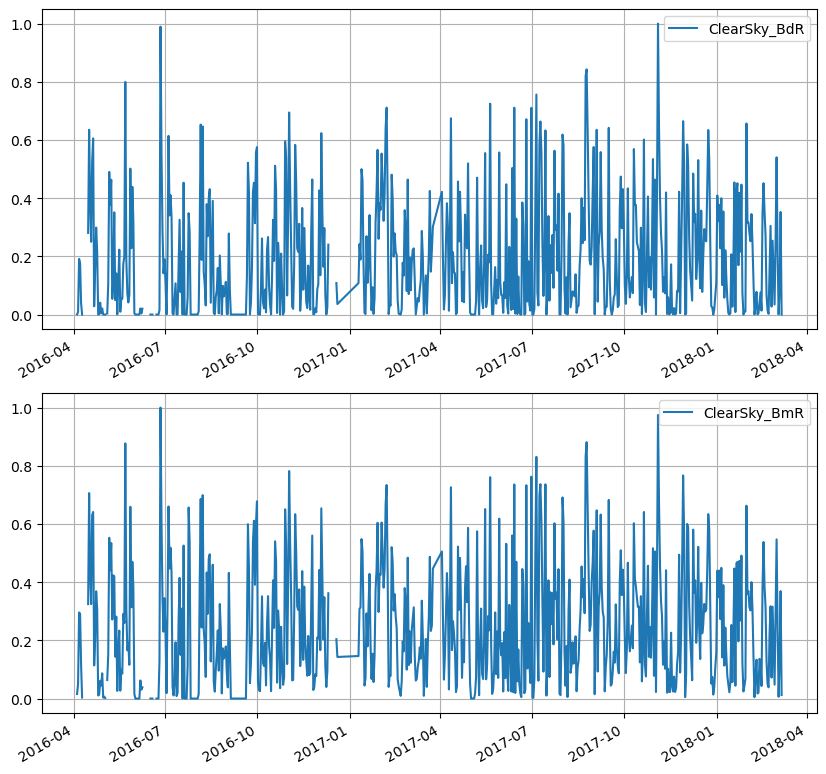

In [14]:
fig = plt.figure(figsize=(10,16),dpi=100)

ax1 = plt.subplot(311,)
daily_obs_CSd_adj.plot(label='ClearSky_BdR');
plt.legend();
plt.grid();

ax2 = plt.subplot(312,)
daily_obs_CSm_adj.plot(label='ClearSky_BmR');
plt.legend();
plt.grid();

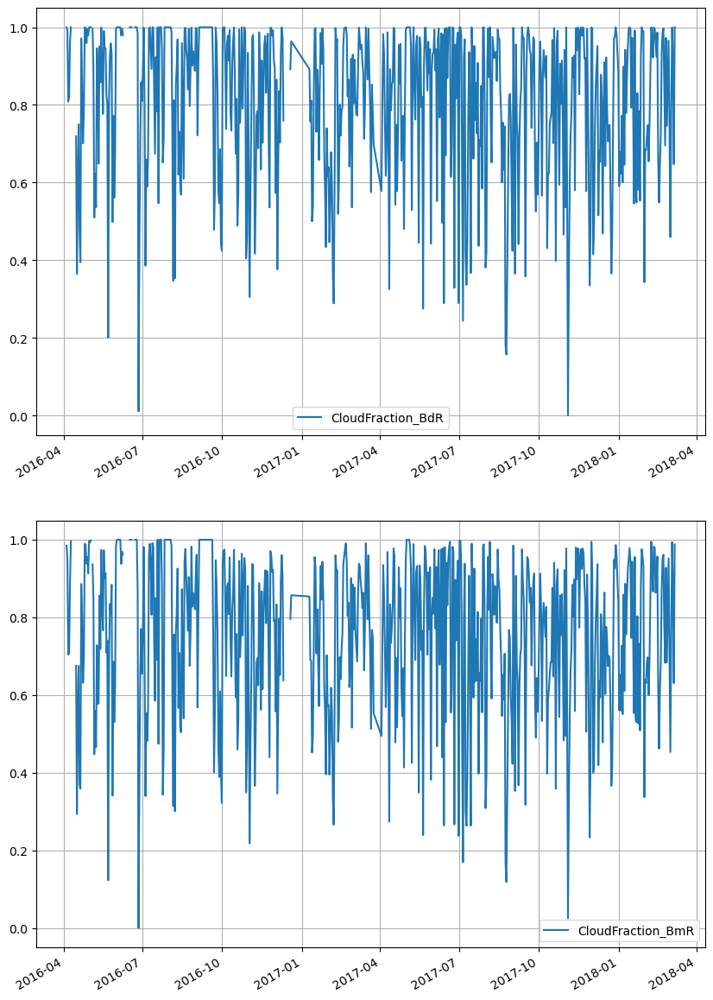

In [15]:
fig = plt.figure(figsize=(10,16),dpi=100)

ax1 = plt.subplot(211,)
daily_obs_CFd.plot(label='CloudFraction_BdR');
plt.legend();
plt.grid();

ax2 = plt.subplot(212,)
daily_obs_CFm.plot(label='CloudFraction_BmR');
plt.legend();
plt.grid();

(array([0.00296736, 0.        , 0.00296736, 0.00296736, 0.00593472,
        0.01038576, 0.02373887, 0.02670623, 0.01632047, 0.03412463,
        0.03264095, 0.05934718, 0.05192878, 0.08160237, 0.06083086,
        0.07566766, 0.07121662, 0.09792285, 0.11127596]),
 array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
        0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95]),
 [<matplotlib.patches.Polygon at 0x7fa4896f5640>])

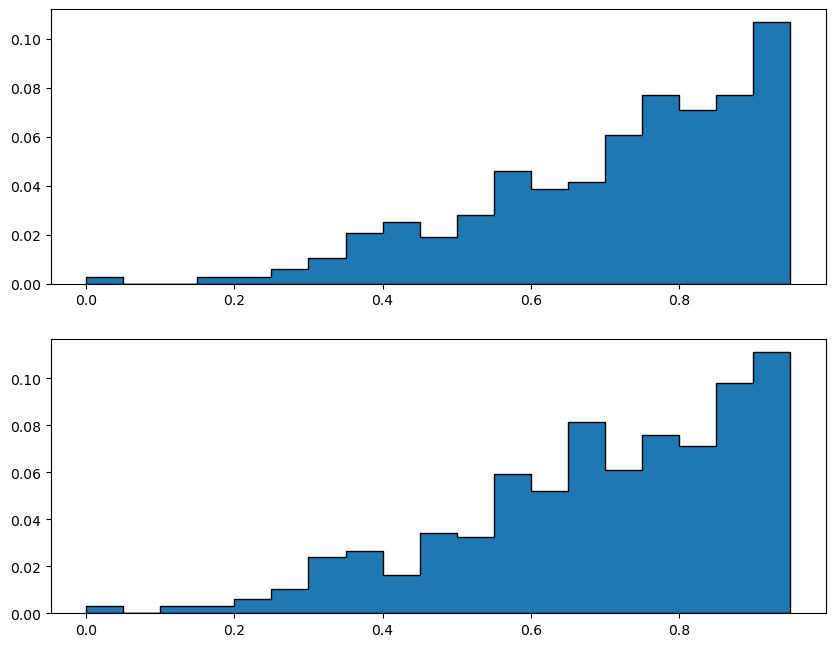

In [16]:
fig = plt.figure(figsize=(10,8),dpi=100)

ax = plt.subplot()
weights1 = np.ones_like(daily_obs_CFd) / len(daily_obs_CFd)
weights2 = np.ones_like(daily_obs_CFm) / len(daily_obs_CFm)

plt.subplot(211)
plt.hist(daily_obs_CFd, weights=weights1, bins=np.arange(0,1,0.05), histtype="stepfilled", edgecolor='black', label='daily_obs_CFd')

plt.subplot(212)
plt.hist(daily_obs_CFm, weights=weights2, bins=np.arange(0,1,0.05), histtype="stepfilled", edgecolor='black', label='daily_obs_CFm')

In [17]:
ACCESS_CFr = pd.Series(ACCESS_CF['ACCESS Cloud Fraction'],name='ACCESS Cloud Fraction')

In [18]:
ACCESS_CFr = ACCESS_CFr.where(daily_obs_CFd.isna() == False)

In [19]:
daily_obs_CFd = daily_obs_CFd.where(daily_obs_CFd.isna() == False)

In [20]:
for i in np.arange(len(daily_obs_CFd)):
    if daily_obs_CFd[i] == np.nan:
        ACCESS_CFr.drop(i)

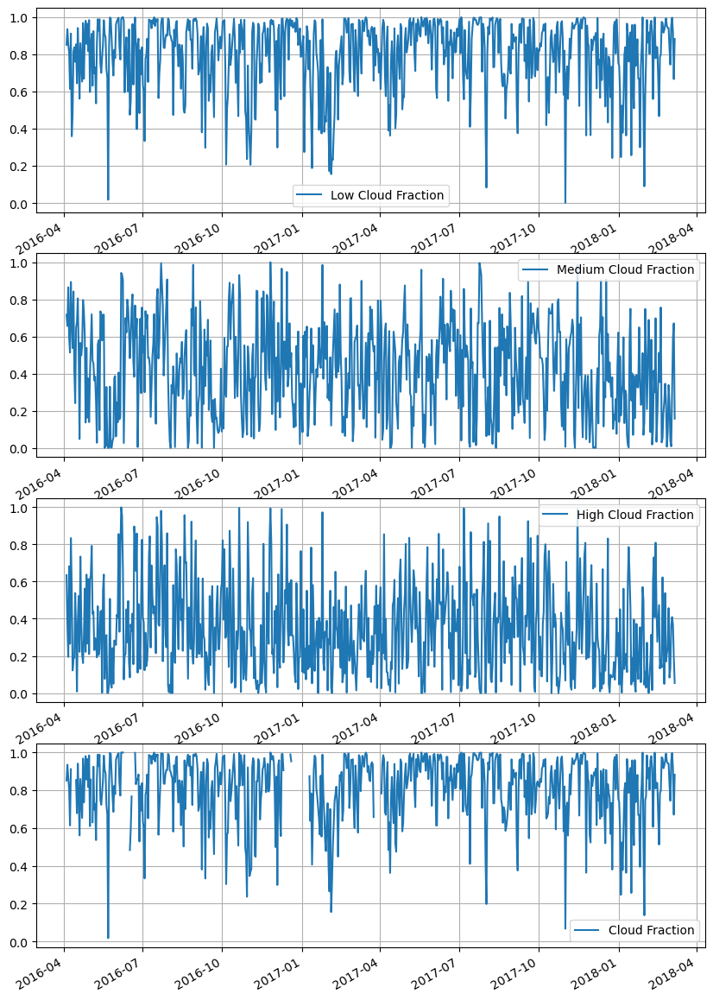

In [21]:
fig = plt.figure(figsize=(10,16),dpi=100)

ax1 = plt.subplot(411,)
ACCESS_LOW.plot(label='Low Cloud Fraction');
plt.legend();
plt.grid();

ax2 = plt.subplot(412,)
ACCESS_MID.plot(label='Medium Cloud Fraction');
plt.legend();
plt.grid();

ax3 = plt.subplot(413,)
ACCESS_HIGH.plot(label='High Cloud Fraction');
plt.legend();
plt.grid();

ax4 = plt.subplot(414,)
ACCESS_CFr.plot(label='Cloud Fraction');
plt.legend();
plt.grid();

(array([0.0014245 , 0.0014245 , 0.0014245 , 0.002849  , 0.002849  ,
        0.0042735 , 0.00854701, 0.01566952, 0.00712251, 0.01282051,
        0.02421652, 0.02991453, 0.03988604, 0.06125356, 0.07407407,
        0.07549858, 0.10826211, 0.11111111, 0.14387464]),
 array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
        0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95]),
 [<matplotlib.patches.Polygon at 0x7fa439d1cd90>])

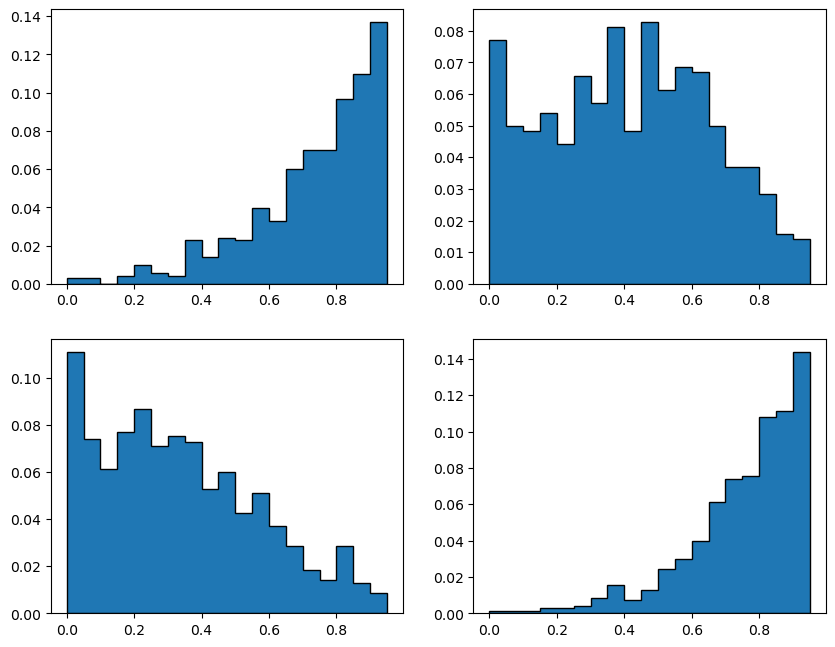

In [22]:
fig = plt.figure(figsize=(10,8),dpi=100)

ax = plt.subplot()
weights1 = np.ones_like(ACCESS_LOW) / len(ACCESS_LOW)
weights2 = np.ones_like(ACCESS_MID) / len(ACCESS_MID)
weights3 = np.ones_like(ACCESS_HIGH) / len(ACCESS_HIGH)
weights4 = np.ones_like(ACCESS_CF['ACCESS Cloud Fraction']) / len(ACCESS_CF['ACCESS Cloud Fraction'])

plt.subplot(221)
plt.hist(ACCESS_LOW, weights=weights1, bins=np.arange(0,1,0.05), histtype="stepfilled", edgecolor='black', label='Low Cloud Fraction')

plt.subplot(222)
plt.hist(ACCESS_MID, weights=weights2, bins=np.arange(0,1,0.05), histtype="stepfilled", edgecolor='black', label='Medium Cloud Fraction')

plt.subplot(223)
plt.hist(ACCESS_HIGH, weights=weights3, bins=np.arange(0,1,0.05), histtype="stepfilled", edgecolor='black', label='High Cloud Fraction')

plt.subplot(224)
plt.hist(ACCESS_CF['ACCESS Cloud Fraction'], weights=weights4, bins=np.arange(0,1,0.05), histtype="stepfilled", edgecolor='black', label='Cloud Fraction')

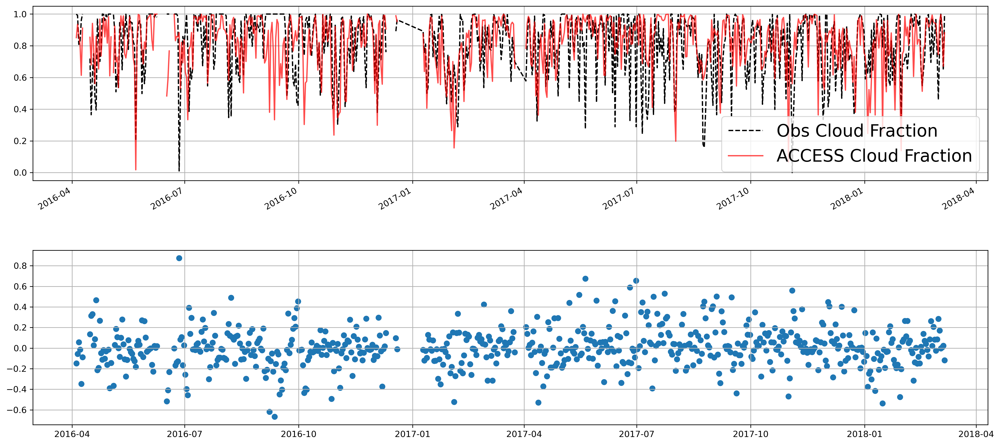

In [33]:
fig = plt.figure(figsize=(20,10),dpi=300)
plt.subplots_adjust(hspace=0.4)

ax1 = plt.subplot(211)
daily_obs_CFd.plot(label='Obs Cloud Fraction',color='black',linestyle='--');
ACCESS_CFr.plot(label='ACCESS Cloud Fraction',color='red',alpha=0.7);
plt.legend(loc='lower right',fontsize=20);
plt.grid();

ax2 = plt.subplot(212)
plt.scatter(ACCESS_CFr.index, ACCESS_CFr-daily_obs_CFd)
#plt.legend(loc='lower right',fontsize=20);
plt.grid();

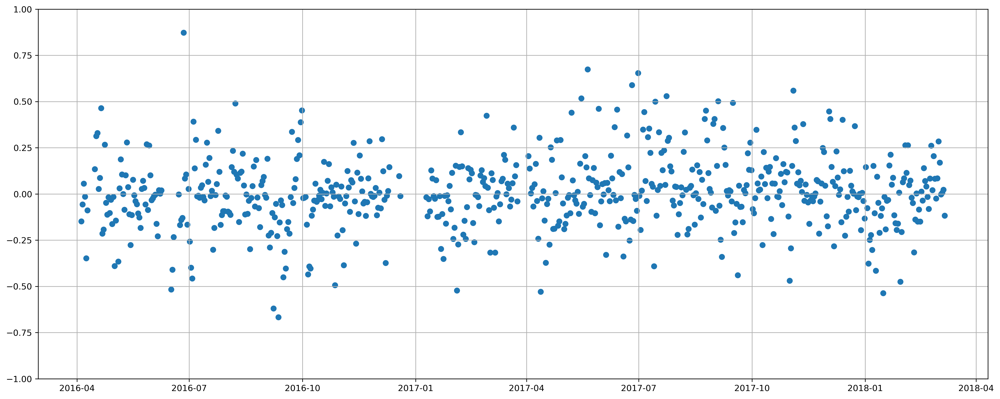

In [43]:
fig = plt.figure(figsize=(20,8),dpi=300)
plt.scatter(ACCESS_CFr.index, ACCESS_CFr-daily_obs_CFd)
plt.ylim(-1,1)
plt.grid()

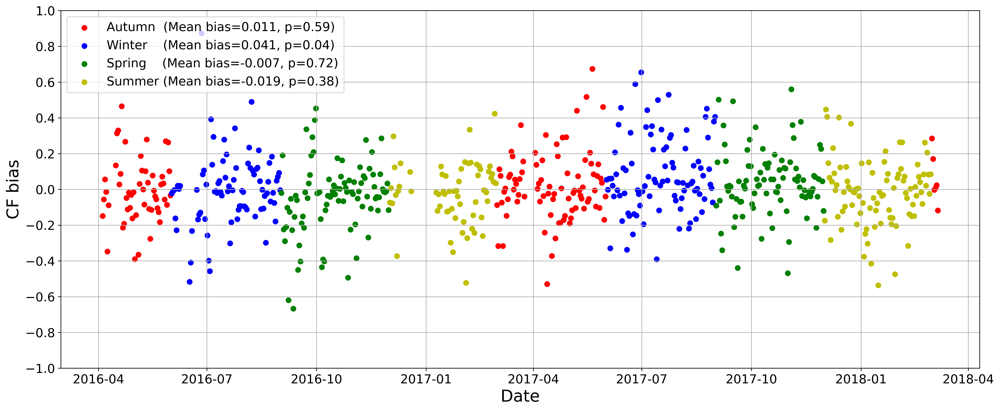

In [104]:
fig = plt.figure(figsize=(20,8),dpi=600)
plt.scatter(MAM_ACCESS_CFr.index, MAM_ACCESS_CFr-MAM_obs_CFd, c='r',label='Autumn  (Mean bias=0.011, p=0.59)')
plt.scatter(JJA_ACCESS_CFr.index, JJA_ACCESS_CFr-JJA_obs_CFd, c='b',label='Winter    (Mean bias=0.041, p=0.04)')
plt.scatter(SON_ACCESS_CFr.index, SON_ACCESS_CFr-SON_obs_CFd, c='g',label='Spring    (Mean bias=-0.007, p=0.72)')
plt.scatter(DJF_ACCESS_CFr.index, DJF_ACCESS_CFr-DJF_obs_CFd, c='y',label='Summer (Mean bias=-0.019, p=0.38)')
plt.legend(loc='upper left',fontsize=15)
plt.yticks(np.arange(-1,1.1,0.2),fontsize=15)
plt.xticks(fontsize=15)
plt.xlabel('Date',fontsize=20)
plt.ylabel('CF bias',fontsize=20)
plt.grid()
#plt.savefig('/Users/peizhangcheng/Desktop/CF_bias_scatter.jpg')

In [73]:
np.mean(DJF_ACCESS_CFr-DJF_obs_CFd)

-0.019032986689056893

In [74]:
np.mean(MAM_ACCESS_CFr-MAM_obs_CFd)

0.010710419363114976

In [98]:
np.mean(MAM_ACCESS_CFr)

0.8353842333620344

In [99]:
np.mean(MAM_obs_CFd)

0.8246738139989194

In [75]:
np.mean(JJA_ACCESS_CFr-JJA_obs_CFd)

0.041152454624625294

In [76]:
np.mean(SON_ACCESS_CFr-SON_obs_CFd)

-0.007317800516760801

In [80]:
stats.ttest_ind(DJF_ACCESS_CFr.dropna(), DJF_obs_CFd.dropna())

Ttest_indResult(statistic=-0.8720027444973516, pvalue=0.383895047452566)

In [81]:
stats.ttest_ind(MAM_ACCESS_CFr.dropna(), MAM_obs_CFd.dropna())

Ttest_indResult(statistic=0.5397813675777487, pvalue=0.589773789666235)

In [83]:
stats.ttest_ind(JJA_ACCESS_CFr.dropna(), JJA_obs_CFd.dropna())

Ttest_indResult(statistic=2.0214496319256017, pvalue=0.04400272670845069)

In [84]:
stats.ttest_ind(SON_ACCESS_CFr.dropna(), SON_obs_CFd.dropna())

Ttest_indResult(statistic=-0.3642813817952897, pvalue=0.7158605882635038)

In [25]:
pd_obs_CFd = daily_obs_CFd.to_frame()
pd_obs_CFm = daily_obs_CFm.to_frame()
pd_obs_CFd['index'] = pd_obs_CFd.index.tolist()
pd_obs_CFm['index'] = pd_obs_CFm.index.tolist()
ACCESS_CF['index'] = ACCESS_CF.index.tolist()

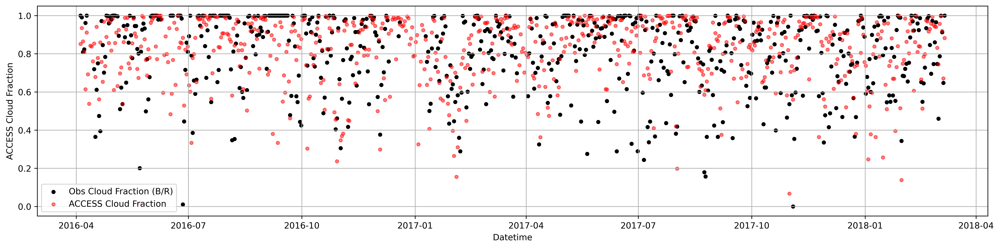

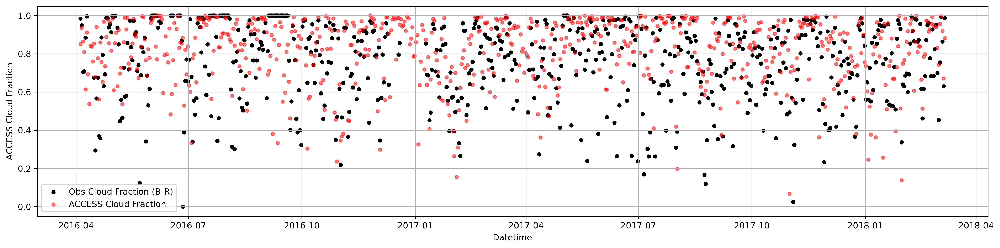

In [26]:
fig = plt.figure(figsize=(20,10),dpi=600)
ax1 = plt.subplot(211,)
pd_obs_CFd.plot(x = 'index', y = 'ClearSky_BdR', kind='scatter', label='Obs Cloud Fraction (B/R)',color='black', ax=ax1, s=15);
ACCESS_CF.plot(x = 'index', y = 'ACCESS Cloud Fraction', kind='scatter', label='ACCESS Cloud Fraction',color='red',alpha=0.5, ax=ax1, s=15);
plt.legend(loc='lower left');
plt.xlabel('Datetime');
plt.grid();
plt.show()

fig = plt.figure(figsize=(20,10),dpi=300)
ax2 = plt.subplot(212,)
pd_obs_CFm.plot(x = 'index', y = 'ClearSky_BmR', kind='scatter', label='Obs Cloud Fraction (B-R)',color='black', ax=ax2, s=15);
ACCESS_CF.plot(x = 'index', y = 'ACCESS Cloud Fraction', kind='scatter', label='ACCESS Cloud Fraction',color='red',alpha=0.5, ax=ax2, s=15);
plt.legend(loc='lower left');
plt.xlabel('Datetime');
plt.grid();
plt.show()

In [24]:
daily_obs_CFd = pd.Series(daily_obs_CFd,name='Obs Cloud Fraction (B/R)',dtype='float64')
daily_obs_CFm = pd.Series(daily_obs_CFm,name='Obs Cloud Fraction (B-R)',dtype='float64')

In [25]:
CF = pd.concat([ACCESS_CFr,daily_obs_CFd,daily_obs_CFm],axis = 1)
CF.corr()

,ACCESS Cloud Fraction,Obs Cloud Fraction (B/R),Obs Cloud Fraction (B-R)
ACCESS Cloud Fraction,1.000000,0.462298,0.444808
Obs Cloud Fraction (B/R),0.462298,1.000000,0.981870
Obs Cloud Fraction (B-R),0.444808,0.981870,1.000000


In [45]:
np.mean(ACCESS_CFr)

0.8156995326831816

In [101]:
import matplotlib.gridspec as gridspec

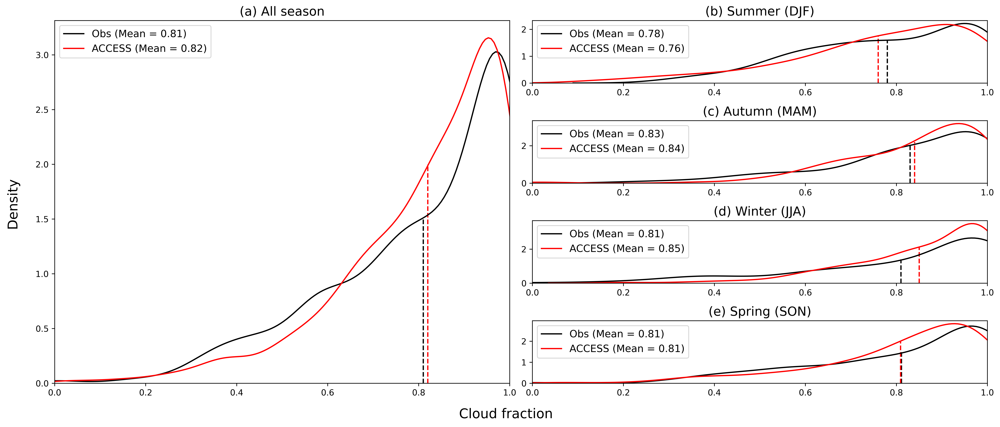

In [105]:
fig = plt.figure(figsize=(20,8),dpi=600)
gridspec.GridSpec(4,2)
plt.subplots_adjust(hspace=0.6)
plt.subplots_adjust(wspace=0.05)

fig.text(0.5, 0.06, 'Cloud fraction', ha='center', va='center',fontsize=16)
fig.text(0.09, 0.5, 'Density', ha='center', va='center', rotation='vertical',fontsize=16)

ax1 = plt.subplot2grid((4,2),(0,0),colspan=1, rowspan=4)
sns.kdeplot(x=daily_obs_CFd, label='Obs (Mean = 0.81)',color='black');
sns.kdeplot(x=ACCESS_CFr, label='ACCESS (Mean = 0.82)',color='red')
ax1.vlines([0.81], 0, 1.5, linestyles='dashed', colors='black')
ax1.vlines([0.82], 0, 2, linestyles='dashed', colors='red')
ax1.set_xlabel(None)
ax1.set_ylabel(None)
plt.title('(a) All season',fontsize=15)
plt.legend(loc="upper left", fontsize=12)
plt.xlim(0,1)

ax2 = plt.subplot2grid((4,2),(0,1))
sns.kdeplot(x=DJF_obs_CFd, label='Obs (Mean = 0.78)', color='black')
sns.kdeplot(x=DJF_ACCESS_CFr, label='ACCESS (Mean = 0.76)', color='red');
ax2.vlines([0.78], 0, 1.6, linestyles='dashed', colors='black')
ax2.vlines([0.76], 0, 1.76, linestyles='dashed', colors='red')
ax2.set_xlabel(None)
ax2.set_ylabel(None)
plt.legend(loc='upper left',fontsize=12)
plt.xlim(0,1)
plt.title('(b) Summer (DJF)',fontsize=15)

ax3 = plt.subplot2grid((4,2),(1,1))
sns.kdeplot(x=MAM_obs_CFd, label='Obs (Mean = 0.83)', color='black')
sns.kdeplot(x=MAM_ACCESS_CFr, label='ACCESS (Mean = 0.84)', color='red');
ax3.vlines([0.83], 0, 2.05, linestyles='dashed', colors='black')
ax3.vlines([0.84], 0, 2.2, linestyles='dashed', colors='red')
ax3.set_xlabel(None)
ax3.set_ylabel(None)
plt.xlim(0,1)
plt.legend(loc='upper left',fontsize=12)
plt.title('(c) Autumn (MAM)',fontsize=15)

ax4 = plt.subplot2grid((4,2),(2,1))
sns.kdeplot(x=JJA_obs_CFd, label='Obs (Mean = 0.81)', color='black')
sns.kdeplot(x=JJA_ACCESS_CFr, label='ACCESS (Mean = 0.85)', color='red');
ax4.vlines([0.81], 0, 1.4, linestyles='dashed', colors='black')
ax4.vlines([0.85], 0, 2.1, linestyles='dashed', colors='red')
ax4.set_xlabel(None)
ax4.set_ylabel(None)
plt.xlim(0,1)
plt.legend(loc='upper left',fontsize=12)
plt.title('(d) Winter (JJA)',fontsize=15)

ax5 = plt.subplot2grid((4,2),(3,1))
sns.kdeplot(x=SON_obs_CFd, label='Obs (Mean = 0.81)', color='black')
sns.kdeplot(x=SON_ACCESS_CFr, label='ACCESS (Mean = 0.81)', color='red');
ax5.vlines([0.811], 0, 1.5, linestyles='dashed', colors='black')
ax5.vlines([0.809], 0, 2, linestyles='dashed', colors='red')
ax5.set_xlabel(None)
ax5.set_ylabel(None)
plt.xlim(0,1)
plt.legend(loc='upper left',fontsize=12)
plt.title('(e) Spring (SON)',fontsize=15)

#plt.savefig('/Users/peizhangcheng/Desktop/CF_distribution.jpg')

Text(0, 0.5, 'Density')

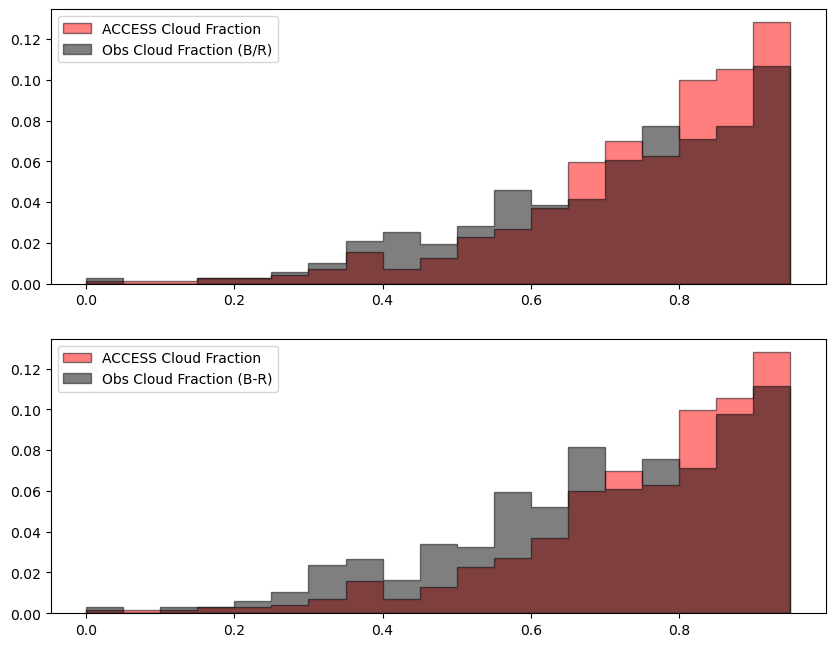

In [46]:
fig = plt.figure(figsize=(10,8),dpi=100)

weights1 = np.ones_like(daily_obs_CFd) / len(daily_obs_CFd)
weights2 = np.ones_like(daily_obs_CFm) / len(daily_obs_CFm)
weights3 = np.ones_like(ACCESS_CFr) / len(ACCESS_CFr)

ax1 = plt.subplot(211,)
plt.hist(ACCESS_CFr, weights=weights3, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'red', edgecolor='black', label='ACCESS Cloud Fraction')
plt.hist(daily_obs_CFd, weights=weights1, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'black', edgecolor='black', label='Obs Cloud Fraction (B/R)')
plt.legend(loc='upper left')
ax.set_ylabel("Density", fontsize=14)

ax2 = plt.subplot(212,)
plt.hist(ACCESS_CFr, weights=weights3, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'red', edgecolor='black', label='ACCESS Cloud Fraction')
plt.hist(daily_obs_CFm, weights=weights2, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'black', edgecolor='black', label='Obs Cloud Fraction (B-R)')
plt.legend(loc='upper left')
ax.set_ylabel("Density", fontsize=14)

In [31]:
np_obs_CFd = daily_obs_CFd.where(daily_obs_CFd.isna()==False).values
np_obs_CFm = daily_obs_CFm.where(daily_obs_CFd.isna()==False).values
np_ACCESS_CFr = ACCESS_CFr.where(daily_obs_CFd.isna()==False).values

np_obs_CFd = np_obs_CFd[~pd.isna(np_obs_CFd)]
np_obs_CFm = np_obs_CFm[~pd.isna(np_obs_CFm)]
np_ACCESS_CFr = np_ACCESS_CFr[~pd.isna(np_ACCESS_CFr)]

<ipython-input-32-f1464f723ed1>:13: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  plt.hist2d(x1, y, bins=40, norm=LogNorm(), cmap='viridis_r', vmin=1, vmax=100)
<ipython-input-32-f1464f723ed1>:26: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  plt.hist2d(x2, y, bins=40, norm=LogNorm(), cmap='viridis_r', vmin=1, vmax=100)


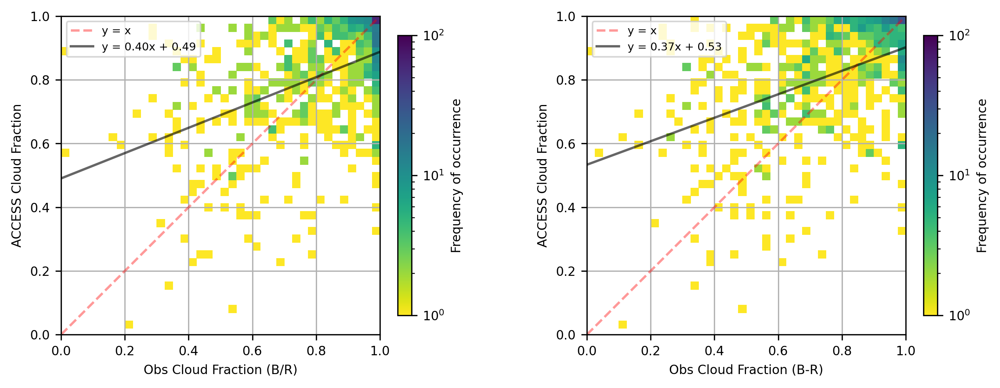

In [32]:
fig = plt.figure(figsize=(10,8), dpi=300)
plt.subplots_adjust(wspace=0.5)

x1 = np_obs_CFd
x2 = np_obs_CFm
y = np_ACCESS_CFr
x = np.arange(0,2)

ax1 = plt.subplot(121,)
plt.gca().set_aspect('equal', adjustable='box')
plt.xlabel('Obs Cloud Fraction (B/R)')
plt.ylabel('ACCESS Cloud Fraction')
plt.hist2d(x1, y, bins=40, norm=LogNorm(), cmap='viridis_r', vmin=1, vmax=100)
plt.xlim(0,1)
plt.ylim(0,1)
plt.plot(x,x,"--",color='r',alpha=0.4,label='y = x')
plt.plot(x,0.3975*x + 0.4905,"-",color='black',alpha=0.6,label='y = 0.40x + 0.49')
plt.legend(fontsize=7)
plt.grid()
plt.colorbar(label='Frequency of occurrence', fraction=0.04)

ax2 = plt.subplot(122,)
plt.gca().set_aspect('equal', adjustable='box')
plt.xlabel('Obs Cloud Fraction (B-R)')
plt.ylabel('ACCESS Cloud Fraction')
plt.hist2d(x2, y, bins=40, norm=LogNorm(), cmap='viridis_r', vmin=1, vmax=100)
plt.xlim(0,1)
plt.ylim(0,1)
plt.plot(x,x,"--",color='r',alpha=0.4,label='y = x')
plt.plot(x,0.3687*x + 0.5335,"-",color='black',alpha=0.6,label='y = 0.37x + 0.53')
plt.legend(fontsize=7)
plt.grid()
plt.colorbar(label='Frequency of occurrence', fraction=0.04)

In [33]:
z1 = np.polyfit(x1, y, 1)
p1 = np.poly1d(z1) 
print(p1)

z2 = np.polyfit(x2, y, 1)
p2 = np.poly1d(z2) 
print(p2)

 
0.4107 x + 0.4843
 
0.3791 x + 0.5301


In [47]:
DJF_obs_CFd = pd.concat([daily_obs_CFd['2016-12':'2017-02'],daily_obs_CFd['2017-12':'2018-02']],axis=0)
MAM_obs_CFd = pd.concat([daily_obs_CFd['2016-04':'2016-05'],daily_obs_CFd['2017-03':'2017-05'],daily_obs_CFd['2018-03']],axis=0)
JJA_obs_CFd = pd.concat([daily_obs_CFd['2016-06':'2016-08'],daily_obs_CFd['2017-06':'2017-08']],axis=0)
SON_obs_CFd = pd.concat([daily_obs_CFd['2016-09':'2016-11'],daily_obs_CFd['2017-09':'2017-11']],axis=0)

DJF_obs_CFm = pd.concat([daily_obs_CFm['2016-12':'2017-02'],daily_obs_CFm['2017-12':'2018-02']],axis=0)
MAM_obs_CFm = pd.concat([daily_obs_CFm['2016-04':'2016-05'],daily_obs_CFm['2017-03':'2017-05'],daily_obs_CFm['2018-03']],axis=0)
JJA_obs_CFm = pd.concat([daily_obs_CFm['2016-06':'2016-08'],daily_obs_CFm['2017-06':'2017-08']],axis=0)
SON_obs_CFm = pd.concat([daily_obs_CFm['2016-09':'2016-11'],daily_obs_CFm['2017-09':'2017-11']],axis=0)

DJF_ACCESS_CFr = pd.concat([ACCESS_CFr['2016-12':'2017-02'],ACCESS_CFr['2017-12':'2018-02']],axis=0)
MAM_ACCESS_CFr = pd.concat([ACCESS_CFr['2016-04':'2016-05'],ACCESS_CFr['2017-03':'2017-05'],ACCESS_CFr['2018-03']],axis=0)
JJA_ACCESS_CFr = pd.concat([ACCESS_CFr['2016-06':'2016-08'],ACCESS_CFr['2017-06':'2017-08']],axis=0)
SON_ACCESS_CFr = pd.concat([ACCESS_CFr['2016-09':'2016-11'],ACCESS_CFr['2017-09':'2017-11']],axis=0)

In [48]:
print(np.mean(DJF_obs_CFd),np.mean(MAM_obs_CFd),np.mean(JJA_obs_CFd),np.mean(SON_obs_CFd))

0.7821603827609835 0.8246738139989194 0.8136017126646101 0.8145162506926448


In [49]:
print(np.mean(DJF_ACCESS_CFr),np.mean(MAM_ACCESS_CFr),np.mean(JJA_ACCESS_CFr),np.mean(SON_ACCESS_CFr))

0.7631273960719271 0.8353842333620344 0.854754167289236 0.8071984501758842


Text(0.5, 1.0, '(e) Cloud fraction SON distribution')

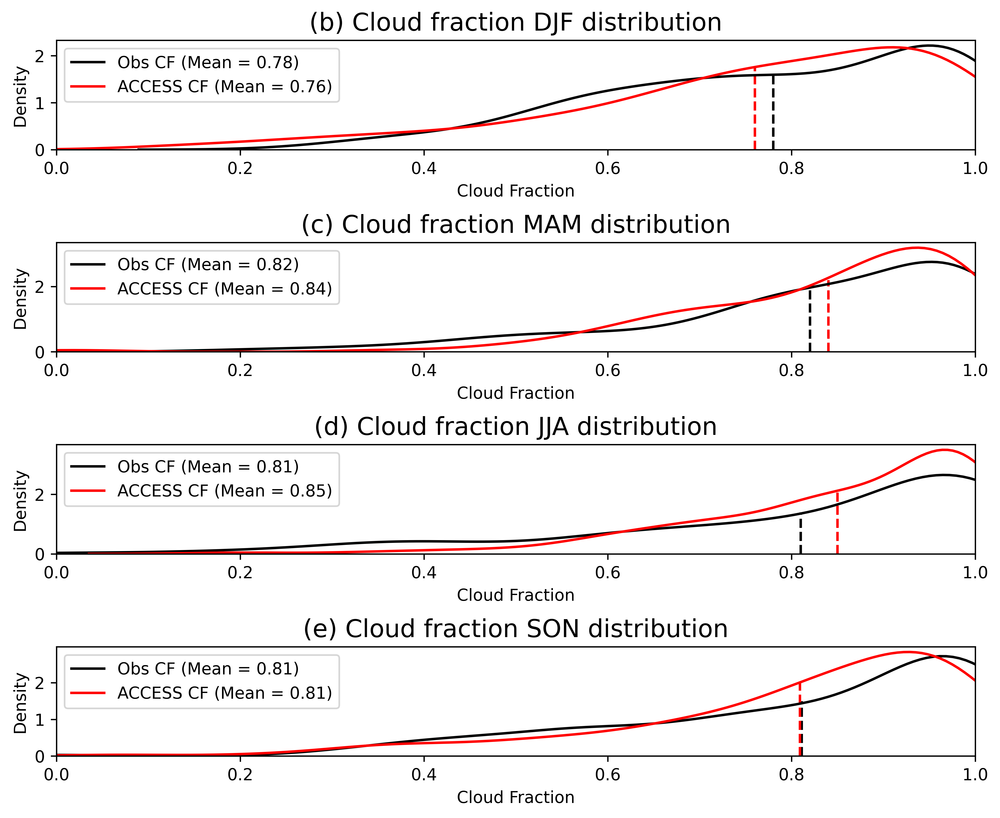

In [34]:
fig = plt.figure(figsize=(10,8),dpi=600)
plt.subplots_adjust(hspace=0.85)

ax1 = plt.subplot(411,)
sns.kdeplot(x=DJF_obs_CFd, label='Obs CF (Mean = 0.78)', color='black')
sns.kdeplot(x=DJF_ACCESS_CFr, label='ACCESS CF (Mean = 0.76)', color='red');
ax1.vlines([0.78], 0, 1.6, linestyles='dashed', colors='black')
ax1.vlines([0.76], 0, 1.76, linestyles='dashed', colors='red')
plt.legend(loc='upper left',fontsize=10)
plt.xlim(0,1)
plt.xlabel('Cloud Fraction')
plt.title('(b) Cloud fraction DJF distribution',fontsize=15)

ax2 = plt.subplot(412,sharex=ax1)
sns.kdeplot(x=MAM_obs_CFd, label='Obs CF (Mean = 0.82)', color='black')
sns.kdeplot(x=MAM_ACCESS_CFr, label='ACCESS CF (Mean = 0.84)', color='red');
ax2.vlines([0.82], 0, 2.05, linestyles='dashed', colors='black')
ax2.vlines([0.84], 0, 2.2, linestyles='dashed', colors='red')
plt.xlim(0,1)
plt.xlabel('Cloud Fraction')
plt.legend(loc='upper left',fontsize=10)
plt.title('(c) Cloud fraction MAM distribution',fontsize=15)

ax3 = plt.subplot(413,sharex=ax1)
sns.kdeplot(x=JJA_obs_CFd, label='Obs CF (Mean = 0.81)', color='black')
sns.kdeplot(x=JJA_ACCESS_CFr, label='ACCESS CF (Mean = 0.85)', color='red');
ax3.vlines([0.81], 0, 1.4, linestyles='dashed', colors='black')
ax3.vlines([0.85], 0, 2.1, linestyles='dashed', colors='red')
plt.xlim(0,1)
plt.xlabel('Cloud Fraction')
plt.legend(loc='upper left',fontsize=10)
plt.title('(d) Cloud fraction JJA distribution',fontsize=15)

ax4 = plt.subplot(414,sharex=ax1)
sns.kdeplot(x=SON_obs_CFd, label='Obs CF (Mean = 0.81)', color='black')
sns.kdeplot(x=SON_ACCESS_CFr, label='ACCESS CF (Mean = 0.81)', color='red');
ax4.vlines([0.811], 0, 1.5, linestyles='dashed', colors='black')
ax4.vlines([0.809], 0, 2, linestyles='dashed', colors='red')
plt.xlim(0,1)
plt.xlabel('Cloud Fraction')
plt.legend(loc='upper left',fontsize=10)
plt.title('(e) Cloud fraction SON distribution',fontsize=15)

#plt.savefig('/Users/peizhangcheng/Desktop/CF_seasonal_distribution.jpg')

In [60]:
hist1,edges = np.histogram(DJF_ACCESS_CFr,np.arange(0.025,1.025,0.05))
hist2,edges = np.histogram(DJF_obs_CFd,np.arange(0.025,1.025,0.05))
hist3,edges = np.histogram(MAM_ACCESS_CFr,np.arange(0.025,1.025,0.05))
hist4,edges = np.histogram(MAM_obs_CFd,np.arange(0.025,1.025,0.05))
hist5,edges = np.histogram(JJA_ACCESS_CFr,np.arange(0.025,1.025,0.05))
hist6,edges = np.histogram(JJA_obs_CFd,np.arange(0.025,1.025,0.05))
hist7,edges = np.histogram(SON_ACCESS_CFr,np.arange(0.025,1.025,0.05))
hist8,edges = np.histogram(SON_obs_CFd,np.arange(0.025,1.025,0.05))

In [61]:
hist8.sum()

127

In [62]:
h1=hist1/136
h2=hist2/125
h3=hist3/117
h4=hist4/109
h5=hist5/121
h6=hist6/113
h7=hist7/159
h8=hist8/127

In [63]:
h1 = [0.        , 0.        , 0.        , 0.00735294, 0.00735294, 0.02205882,
       0.01470588, 0.        , 0.04411765, 0.01470588, 0.03676471,
       0.03676471, 0.05147059, 0.06617647, 0.08088235, 0.125     ,
       0.10294118, 0.09558824, 0.15441176, 0.13970588]

In [64]:
h2 = [0., 0.   , 0.   , 0.   , 0.   , 0.   , 0.008, 0.024, 0.016, 0.032,
       0.032, 0.072, 0.08 , 0.08 , 0.096, 0.112, 0.088, 0.096, 0.12 ,
       0.144]

In [65]:
h3 = [0., 0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.00854701, 0.02564103,
       0.02564103, 0.04273504, 0.07692308, 0.05982906, 0.1025641 ,
       0.07692308, 0.17948718, 0.16239316, 0.23931624]

In [66]:
h4 = [0., 0.        , 0.        , 0.        , 0.00917431, 0.        ,
       0.00917431, 0.01834862, 0.00917431, 0.03669725, 0.02752294,
       0.03669725, 0.05504587, 0.02752294, 0.06422018, 0.08256881,
       0.17431193, 0.09174312, 0.13761468, 0.22018349]

In [67]:
h5 = [0., 0.        , 0.        , 0.        , 0.00826446, 0.        ,
       0.        , 0.00826446, 0.01652893, 0.        , 0.01652893,
       0.00826446, 0.04958678, 0.07438017, 0.11570248, 0.05785124,
       0.11570248, 0.18181818, 0.1322314 , 0.21487603]

In [68]:
h6 = [0., 0.        , 0.        , 0.00884956, 0.00884956, 0.00884956,
       0.01769912, 0.05309735, 0.04424779, 0.02654867, 0.00884956,
       0.02654867, 0.08849558, 0.07079646, 0.05309735, 0.07964602,
       0.09734513, 0.09734513, 0.15044248, 0.15929204]

In [69]:
h7 = [0., 0.        , 0.00628931, 0.        , 0.        , 0.00628931,
       0.00628931, 0.02515723, 0.01886792, 0.01886792, 0.01886792,
       0.03773585, 0.04402516, 0.04402516, 0.06289308, 0.06918239,
       0.13207547, 0.14465409, 0.13207547, 0.2327044 ]

In [70]:
h8 = [0., 0.        , 0.        , 0.        , 0.        , 0.        ,
       0.00787402, 0.03149606, 0.03149606, 0.03937008, 0.02362205,
       0.07086614, 0.07874016, 0.03149606, 0.09448819, 0.07874016,
       0.09448819, 0.11023622, 0.13385827, 0.17322835]

NameError: name 'MultipleLocator' is not defined

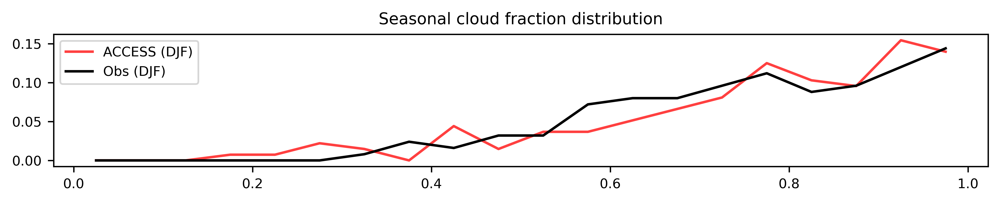

In [55]:
fig = plt.figure(figsize=(10,8), dpi=600)
plt.subplots_adjust(hspace=0.5)
plt.rcParams.update({'font.size': 8}) 

ax1 = plt.subplot(411,)
plt.plot(edges, h1, label='ACCESS (DJF)',color='red',alpha=0.75);
plt.plot(edges, h2, label='Obs (DJF)',color='black');
plt.legend(loc='upper left');
plt.title('Seasonal cloud fraction distribution')

ax = plt.gca()
xmajorLocator = MultipleLocator(0.2)
xmajorFormatter = FormatStrFormatter('%1.1f')
xminorLocator = MultipleLocator(0.05) 
ymajorLocator = MultipleLocator(0.2)
ymajorFormatter = FormatStrFormatter('%1.1f')
yminorLocator = MultipleLocator(0.05) 

plt.xlabel('Cloud Fraction')
plt.ylabel('Probability of occurrence')
ax.xaxis.set_major_locator(xmajorLocator)
ax.xaxis.set_minor_locator(xminorLocator)
ax.yaxis.set_major_locator(ymajorLocator)
ax.yaxis.set_minor_locator(yminorLocator)

ax.xaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='minor', alpha=0.25)

ax2 = plt.subplot(412,)
plt.plot(edges, h3, label='ACCESS (MAM)',color='red',alpha=0.75);
plt.plot(edges, h4, label='Obs (MAM)',color='black');
plt.legend(loc='upper left');

ax = plt.gca()
xmajorLocator = MultipleLocator(0.2)
xmajorFormatter = FormatStrFormatter('%1.1f')
xminorLocator = MultipleLocator(0.05) 
ymajorLocator = MultipleLocator(0.2)
ymajorFormatter = FormatStrFormatter('%1.1f')
yminorLocator = MultipleLocator(0.05) 

plt.xlabel('Cloud Fraction')
plt.ylabel('Probability of occurrence')
ax.xaxis.set_major_locator(xmajorLocator)
ax.xaxis.set_minor_locator(xminorLocator)
ax.yaxis.set_major_locator(ymajorLocator)
ax.yaxis.set_minor_locator(yminorLocator)

ax.xaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='minor', alpha=0.25)

ax1 = plt.subplot(413,)
plt.plot(edges, h5, label='ACCESS (JJA)',color='red',alpha=0.75);
plt.plot(edges, h6, label='Obs (JJA)',color='black');
plt.legend(loc='upper left');

ax = plt.gca()
xmajorLocator = MultipleLocator(0.2)
xmajorFormatter = FormatStrFormatter('%1.1f')
xminorLocator = MultipleLocator(0.05) 
ymajorLocator = MultipleLocator(0.2)
ymajorFormatter = FormatStrFormatter('%1.1f')
yminorLocator = MultipleLocator(0.05) 

plt.xlabel('Cloud Fraction')
plt.ylabel('Probability of occurrence')
ax.xaxis.set_major_locator(xmajorLocator)
ax.xaxis.set_minor_locator(xminorLocator)
ax.yaxis.set_major_locator(ymajorLocator)
ax.yaxis.set_minor_locator(yminorLocator)

ax.xaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='minor', alpha=0.25)

ax1 = plt.subplot(414,)
plt.plot(edges, h7, label='ACCESS (SON)',color='red',alpha=0.75);
plt.plot(edges, h8, label='Obs (SON)',color='black');
plt.legend(loc='upper left');

ax = plt.gca()
xmajorLocator = MultipleLocator(0.2)
xmajorFormatter = FormatStrFormatter('%1.1f')
xminorLocator = MultipleLocator(0.05) 
ymajorLocator = MultipleLocator(0.2)
ymajorFormatter = FormatStrFormatter('%1.1f')
yminorLocator = MultipleLocator(0.05) 

plt.xlabel('Cloud Fraction')
plt.ylabel('Probability of occurrence')
ax.xaxis.set_major_locator(xmajorLocator)
ax.xaxis.set_minor_locator(xminorLocator)
ax.yaxis.set_major_locator(ymajorLocator)
ax.yaxis.set_minor_locator(yminorLocator)

ax.xaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='minor', alpha=0.25)

#plt.savefig('/Users/peizhangcheng/Desktop/CF_seasonal_distribution.jpg')

Text(0, 0.5, 'Density')

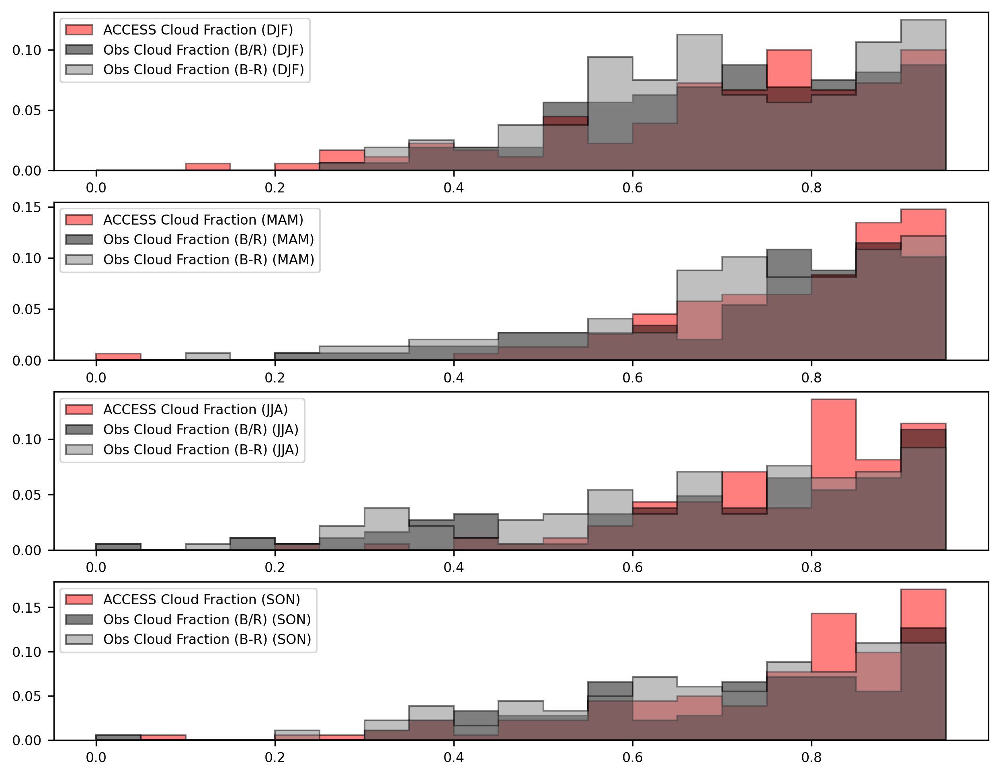

In [52]:
fig = plt.figure(figsize=(10,8),dpi=300)

weights1 = np.ones_like(DJF_obs_CFd) / len(DJF_obs_CFd)
weights2 = np.ones_like(DJF_obs_CFm) / len(DJF_obs_CFm)
weights3 = np.ones_like(DJF_ACCESS_CFr) / len(DJF_ACCESS_CFr)
weights4 = np.ones_like(MAM_obs_CFd) / len(MAM_obs_CFd)
weights5 = np.ones_like(MAM_obs_CFd) / len(MAM_obs_CFd)
weights6 = np.ones_like(MAM_ACCESS_CFr) / len(MAM_ACCESS_CFr)
weights7 = np.ones_like(JJA_obs_CFd) / len(JJA_obs_CFd)
weights8 = np.ones_like(JJA_obs_CFm) / len(JJA_obs_CFm)
weights9 = np.ones_like(JJA_ACCESS_CFr) / len(JJA_ACCESS_CFr)
weights10 = np.ones_like(SON_obs_CFd) / len(SON_obs_CFd)
weights11 = np.ones_like(SON_obs_CFm) / len(SON_obs_CFm)
weights12 = np.ones_like(SON_ACCESS_CFr) / len(SON_ACCESS_CFr)

ax1 = plt.subplot(411,)
plt.hist(DJF_ACCESS_CFr, weights=weights3, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'red', edgecolor='black', label='ACCESS Cloud Fraction (DJF)')
plt.hist(DJF_obs_CFd, weights=weights1, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'black', edgecolor='black', label='Obs Cloud Fraction (B/R) (DJF)')
plt.hist(DJF_obs_CFm, weights=weights2, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'grey', edgecolor='black', label='Obs Cloud Fraction (B-R) (DJF)')
plt.legend(loc='upper left')
ax.set_ylabel("Density", fontsize=14)

ax2 = plt.subplot(412,)
plt.hist(MAM_ACCESS_CFr, weights=weights6, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'red', edgecolor='black', label='ACCESS Cloud Fraction (MAM)')
plt.hist(MAM_obs_CFd, weights=weights4, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'black', edgecolor='black', label='Obs Cloud Fraction (B/R) (MAM)')
plt.hist(MAM_obs_CFm, weights=weights5, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'grey', edgecolor='black', label='Obs Cloud Fraction (B-R) (MAM)')
plt.legend(loc='upper left')
ax.set_ylabel("Density", fontsize=14)

ax3 = plt.subplot(413,)
plt.hist(JJA_ACCESS_CFr, weights=weights9, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'red', edgecolor='black', label='ACCESS Cloud Fraction (JJA)')
plt.hist(JJA_obs_CFd, weights=weights7, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'black', edgecolor='black', label='Obs Cloud Fraction (B/R) (JJA)')
plt.hist(JJA_obs_CFm, weights=weights8, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'grey', edgecolor='black', label='Obs Cloud Fraction (B-R) (JJA)')
plt.legend(loc='upper left')
ax.set_ylabel("Density", fontsize=14)

ax4 = plt.subplot(414,)
plt.hist(SON_ACCESS_CFr, weights=weights12, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'red', edgecolor='black', label='ACCESS Cloud Fraction (SON)')
plt.hist(SON_obs_CFd, weights=weights10, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'black', edgecolor='black', label='Obs Cloud Fraction (B/R) (SON)')
plt.hist(SON_obs_CFm, weights=weights11, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'grey', edgecolor='black', label='Obs Cloud Fraction (B-R) (SON)')
plt.legend(loc='upper left')
ax.set_ylabel("Density", fontsize=14)

In [73]:
Years = [16,17,18]
Months = list(range(1,13))

daily_obs_SW = pd.Series(dtype='float64',name='Obs_SW')
daily_obs_LW = pd.Series(dtype='float64',name='Obs_LW')
pd_data1D_SW = pd.Series(dtype='float64',name='ACCESS_SW')
pd_data1D_LW = pd.Series(dtype='float64',name='ACCESS_LW')
Obs_CRE = pd.Series(dtype='float64',name='Obs_CRE')
ACCESS_CRE = pd.Series(dtype='float64',name='ACCESS_CRE')

In [74]:
for Year in Years:
    for Month in Months:
        if (Year == 16) and (Month < 4):
            continue
        elif (Year == 18) and (Month > 3):
            continue
        else:
            filename = '/Users/peizhangcheng/Desktop/Honours/Datasets/b*400_ACCESS_nudged/bx400_SH_met_daily_20' + str(Year) + '-' + str(Month).rjust(2,'0') + '.nc'
            data = xr.open_dataset(filename) 
            # open the model output
            
            fdir = '/Users/peizhangcheng/Desktop/Honours/Project/MQI Radiometers/Radiation_' + str(Year) + str(Month).rjust(2,'0') + '_v4.csv'
            obs = pd.read_csv(fdir) 
            # open the observational data
            
            data1D = data.interp(lat=-54.4996, lon=158.9437, lat_v=-54.4996, lon_u=158.9437)  
            # locate the MI in the model
            
            obs.index = pd.DatetimeIndex(obs['DateTimeUT'])
            daily_obs = obs.resample('D').mean()
            daily_obs = daily_obs.dropna()
            daily_obs.columns = ['Pyranometer_Avg','Pyrgeometer_Avg','CRE','SW_CRE','LW_CRE','SW_clr','LW_clr']
            daily_obs = daily_obs.set_index(pd.to_datetime(daily_obs.index.values) + pd.Timedelta(hours = 12))
            daily_obs['2016-04-04'] = np.nan
            daily_obs['2016-04-09'] = np.nan
            daily_obs['2016-04-10'] = np.nan
            daily_obs['2016-05-02'] = np.nan
            daily_obs['2016-05-03'] = np.nan
            daily_obs['2016-12-15'] = np.nan
            daily_obs['2016-12-16'] = np.nan
            daily_obs['2017-06-09'] = np.nan
            daily_obs['2018-03-06'] = np.nan
            # do some cleaning and calculate the mean
            
            if (Year == 16) and (Month == 4):
                data1D_rsds = data1D.rsds.where((data1D.rsds.time!=data1D.rsds.time[0])&(data1D.rsds.time!=data1D.rsds.time[1])&(data1D.rsds.time!=data1D.rsds.time[2]), drop=True)
                data1D_rlds = data1D.rlds.where((data1D.rlds.time!=data1D.rlds.time[0])&(data1D.rlds.time!=data1D.rlds.time[1])&(data1D.rlds.time!=data1D.rlds.time[2]), drop=True)
                data1D_rsdscs = data1D.rsdscs.where((data1D.rsdscs.time!=data1D.rsdscs.time[0])&(data1D.rsdscs.time!=data1D.rsdscs.time[1])&(data1D.rsdscs.time!=data1D.rsdscs.time[2]), drop=True)
                data1D_rldscs = data1D.rldscs.where((data1D.rldscs.time!=data1D.rldscs.time[0])&(data1D.rldscs.time!=data1D.rldscs.time[1])&(data1D.rldscs.time!=data1D.rldscs.time[2]), drop=True)
                pd_data1D_rsds = pd.Series(data1D_rsds.to_pandas(),name='rsds')
                pd_data1D_rlds = pd.Series(data1D_rlds.to_pandas(),name='rlds')
                pd_data1D_rsdscs = pd.Series(data1D_rsdscs.to_pandas(),name='ACCESS_rsdscs')
                pd_data1D_rldscs = pd.Series(data1D_rldscs.to_pandas(),name='ACCESS_rldscs')
                # make the number of data in obs and model consistent
                
            elif (Year == 18) and (Month == 3):
                pd_data1D_rsds = pd.Series(data1D.rsds.to_pandas(),name='rsds')
                pd_data1D_rsds = pd_data1D_rsds[:6]
                pd_data1D_rlds = pd.Series(data1D.rlds.to_pandas(),name='rlds')
                pd_data1D_rlds = pd_data1D_rlds[:6]
                pd_data1D_rsdscs = pd.Series(data1D.rsdscs.to_pandas(),name='ACCESS_rsdscs')
                pd_data1D_rsdscs = pd_data1D_rsdscs[:6]
                pd_data1D_rldscs = pd.Series(data1D.rldscs.to_pandas(),name='ACCESS_rldscs')
                pd_data1D_rldscs = pd_data1D_rldscs[:6]
            else:
                pd_data1D_rsds = pd.Series(data1D.rsds.to_pandas(),name='rsds')
                pd_data1D_rlds = pd.Series(data1D.rlds.to_pandas(),name='rlds')
                pd_data1D_rsdscs = pd.Series(data1D.rsdscs.to_pandas(),name='ACCESS_rsdscs')
                pd_data1D_rldscs = pd.Series(data1D.rldscs.to_pandas(),name='ACCESS_rldscs')
                # convert the model data into pandas Series to plot
            
            ACCESS_CRE1 = (1-0.055)*(pd_data1D_rsds-pd_data1D_rsdscs)+0.97*(pd_data1D_rlds-pd_data1D_rldscs)
            
            daily_obs_SW = pd.concat([daily_obs_SW, daily_obs.Pyranometer_Avg], axis=0)
            daily_obs_LW = pd.concat([daily_obs_LW, daily_obs.Pyrgeometer_Avg], axis=0)
            Obs_CRE = pd.concat([Obs_CRE, daily_obs.CRE], axis=0)
            pd_data1D_SW = pd.concat([pd_data1D_SW, pd_data1D_rsds], axis=0)                   
            pd_data1D_LW = pd.concat([pd_data1D_LW, pd_data1D_rlds], axis=0)
            ACCESS_CRE = pd.concat([ACCESS_CRE, ACCESS_CRE1], axis=0)
                # concat the observational data and model output

<ipython-input-74-a0ab88b2b6d3>:24: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  daily_obs['2016-04-04'] = np.nan
<ipython-input-74-a0ab88b2b6d3>:25: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  daily_obs['2016-04-09'] = np.nan
<ipython-input-74-a0ab88b2b6d3>:26: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  daily_obs['2016-04-10'] = np.nan
<ipython-input-74-a0ab88b2b6d3>:27: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `fra

In [75]:
daily_obs_SW = pd.Series(daily_obs_SW,name='Obs_SW')
pd_data1D_SW = pd.Series(pd_data1D_SW,name='ACCESS_SW')
daily_obs_LW = pd.Series(daily_obs_LW,name='Obs_LW')
pd_data1D_LW = pd.Series(pd_data1D_LW,name='ACCESS_LW')
Obs_CRE = pd.Series(Obs_CRE,name='Obs_CRE')
ACCESS_CRE = pd.Series(ACCESS_CRE,name='ACCESS_CRE')
daily_obs_CFd = pd.Series(daily_obs_CFd,name='Obs_CF')
ACCESS_CFr = pd.Series(ACCESS_CFr,name='ACCESS_CF')

In [76]:
Whole = pd.concat([daily_obs_SW,pd_data1D_SW,daily_obs_LW,pd_data1D_LW,Obs_CRE,ACCESS_CRE,daily_obs_CFd,ACCESS_CFr], axis=1)

In [77]:
Whole = pd.DataFrame(Whole)
Whole

,Obs_SW,ACCESS_SW,Obs_LW,ACCESS_LW,Obs_CRE,ACCESS_CRE,Obs_CF,ACCESS_CF
2016-04-02 12:00:00,0.000000,NaN,11.843436,NaN,-460.454666,NaN,NaN,NaN
2016-04-04 12:00:00,NaN,56.003518,NaN,330.975002,NaN,-9.970366,0.999827,0.851275
2016-04-05 12:00:00,30.928499,48.827817,339.732689,343.823891,-33.255517,-10.936973,0.990852,0.934912
2016-04-06 12:00:00,71.132403,61.889606,310.451084,303.528656,-0.689122,0.539751,0.808742,0.864729
2016-04-07 12:00:00,75.640487,57.812981,308.554003,323.091275,-10.978552,0.008318,0.823168,0.808875
...,...,...,...,...,...,...,...,...
2018-03-02 12:00:00,156.498101,153.258633,340.401458,340.268625,-17.740982,-18.404299,0.786570,0.956690
2018-03-03 12:00:00,91.369661,112.070734,351.665427,348.813474,-66.672092,-45.839662,0.999345,0.996652
2018-03-04 12:00:00,65.504197,53.586255,311.983252,322.604517,-115.480219,-100.985545,0.912931,0.919154
2018-03-05 12:00:00,150.052708,84.691276,303.434224,297.034025,-34.873281,-85.174682,0.647374,0.670909


In [78]:
Whole['SW_bias'] = Whole['ACCESS_SW'] - Whole['Obs_SW']
Whole['LW_bias'] = Whole['ACCESS_LW'] - Whole['Obs_LW']
Whole['CRE_bias'] = Whole['ACCESS_CRE'] - Whole['Obs_CRE']

In [79]:
Whole

,Obs_SW,ACCESS_SW,Obs_LW,ACCESS_LW,Obs_CRE,ACCESS_CRE,Obs_CF,ACCESS_CF,SW_bias,LW_bias,CRE_bias
2016-04-02 12:00:00,0.000000,NaN,11.843436,NaN,-460.454666,NaN,NaN,NaN,NaN,NaN,NaN
2016-04-04 12:00:00,NaN,56.003518,NaN,330.975002,NaN,-9.970366,0.999827,0.851275,NaN,NaN,NaN
2016-04-05 12:00:00,30.928499,48.827817,339.732689,343.823891,-33.255517,-10.936973,0.990852,0.934912,17.899319,4.091202,22.318544
2016-04-06 12:00:00,71.132403,61.889606,310.451084,303.528656,-0.689122,0.539751,0.808742,0.864729,-9.242797,-6.922428,1.228873
2016-04-07 12:00:00,75.640487,57.812981,308.554003,323.091275,-10.978552,0.008318,0.823168,0.808875,-17.827506,14.537272,10.986871
...,...,...,...,...,...,...,...,...,...,...,...
2018-03-02 12:00:00,156.498101,153.258633,340.401458,340.268625,-17.740982,-18.404299,0.786570,0.956690,-3.239469,-0.132833,-0.663317
2018-03-03 12:00:00,91.369661,112.070734,351.665427,348.813474,-66.672092,-45.839662,0.999345,0.996652,20.701073,-2.851953,20.832430
2018-03-04 12:00:00,65.504197,53.586255,311.983252,322.604517,-115.480219,-100.985545,0.912931,0.919154,-11.917942,10.621265,14.494674
2018-03-05 12:00:00,150.052708,84.691276,303.434224,297.034025,-34.873281,-85.174682,0.647374,0.670909,-65.361431,-6.400199,-50.301401


In [152]:
CF_ACCESS_negSW = []
CF_ACCESS_posSW = []
CF_ACCESS_midSW = []
CF_Obs_negSW = []
CF_Obs_posSW = []
CF_Obs_midSW = []

CF_ACCESS_negLW = []
CF_ACCESS_posLW = []
CF_ACCESS_midLW = []
CF_Obs_negLW = []
CF_Obs_posLW = []
CF_Obs_midLW = []

CF_ACCESS_negCRE = []
CF_ACCESS_posCRE = []
CF_ACCESS_midCRE = []
CF_Obs_negCRE = []
CF_Obs_posCRE = []
CF_Obs_midCRE = []

In [153]:
SW_bias_nona = Whole['SW_bias'].dropna()
LW_bias_nona = Whole['LW_bias'].dropna()
CRE_bias_nona = Whole['CRE_bias'].dropna()

In [154]:
SW_bias_nona

2016-04-05 12:00:00    17.899319
2016-04-06 12:00:00    -9.242797
2016-04-07 12:00:00   -17.827506
2016-04-08 12:00:00     3.131229
2016-04-11 12:00:00   -23.598895
                         ...    
2018-03-01 12:00:00     3.815757
2018-03-02 12:00:00    -3.239469
2018-03-03 12:00:00    20.701073
2018-03-04 12:00:00   -11.917942
2018-03-05 12:00:00   -65.361431
Name: SW_bias, Length: 693, dtype: float64

In [160]:
np.percentile(LW_bias_nona,30)

-7.847992475433114

In [149]:
np.sum(SW_bias_nona < -20) #693-277-175 = 241

78

In [155]:
for row in np.arange(len(Whole)):
    if Whole['SW_bias'][row] < -20: # n=78
        CF_ACCESS_negSW.append(Whole['ACCESS_CF'][row])
        CF_Obs_negSW.append(Whole['Obs_CF'][row])
    
    elif (Whole['SW_bias'][row] > -10) and (Whole['SW_bias'][row] < 10): # n=291
        CF_ACCESS_midSW.append(Whole['ACCESS_CF'][row])
        CF_Obs_midSW.append(Whole['Obs_CF'][row])
    
    elif Whole['SW_bias'][row] > 50: # n=84
        CF_ACCESS_posSW.append(Whole['ACCESS_CF'][row])
        CF_Obs_posSW.append(Whole['Obs_CF'][row])

In [161]:
for row in np.arange(len(Whole)):
    if Whole['LW_bias'][row] < -15:
        CF_ACCESS_negLW.append(Whole['ACCESS_CF'][row]) # n=84
        CF_Obs_negLW.append(Whole['Obs_CF'][row])
    
    elif (Whole['LW_bias'][row] > -5) and (Whole['LW_bias'][row] < 5): # n=241
        CF_ACCESS_midLW.append(Whole['ACCESS_CF'][row])
        CF_Obs_midLW.append(Whole['Obs_CF'][row])
    
    elif Whole['LW_bias'][row] > 15: # n=55
        CF_ACCESS_posLW.append(Whole['ACCESS_CF'][row])
        CF_Obs_posLW.append(Whole['Obs_CF'][row])
        

In [68]:
for row in np.arange(len(Whole)):
    if Whole['CRE_bias'][row] < -10:
        CF_ACCESS_negCRE.append(Whole['ACCESS_CF'][row])
        CF_Obs_negCRE.append(Whole['Obs_CF'][row])
    
    elif (Whole['CRE_bias'][row] > -5) and (Whole['CRE_bias'][row] < 5):
        CF_ACCESS_midCRE.append(Whole['ACCESS_CF'][row])
        CF_Obs_midCRE.append(Whole['Obs_CF'][row])
    
    elif Whole['CRE_bias'][row] > 70:
        CF_ACCESS_posCRE.append(Whole['ACCESS_CF'][row])
        CF_Obs_posCRE.append(Whole['Obs_CF'][row])
        

In [162]:
CF_ACCESS_negSW = pd.Series(CF_ACCESS_negSW, name='ACCESS_CF')
CF_ACCESS_posSW = pd.Series(CF_ACCESS_posSW, name='ACCESS_CF')
CF_ACCESS_midSW = pd.Series(CF_ACCESS_midSW, name='ACCESS_CF')
CF_ACCESS_negLW = pd.Series(CF_ACCESS_negLW, name='ACCESS_CF')
CF_ACCESS_posLW = pd.Series(CF_ACCESS_posLW, name='ACCESS_CF')
CF_ACCESS_midLW = pd.Series(CF_ACCESS_midLW, name='ACCESS_CF')
CF_ACCESS_negCRE = pd.Series(CF_ACCESS_negCRE, name='ACCESS_CF')
CF_ACCESS_posCRE = pd.Series(CF_ACCESS_posCRE, name='ACCESS_CF')
CF_ACCESS_midCRE = pd.Series(CF_ACCESS_midCRE, name='ACCESS_CF')

<ipython-input-162-66eb5b7e6495>:7: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  CF_ACCESS_negCRE = pd.Series(CF_ACCESS_negCRE, name='ACCESS_CF')
<ipython-input-162-66eb5b7e6495>:8: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  CF_ACCESS_posCRE = pd.Series(CF_ACCESS_posCRE, name='ACCESS_CF')
<ipython-input-162-66eb5b7e6495>:9: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  CF_ACCESS_midCRE = pd.Series(CF_ACCESS_midCRE, name='ACCESS_CF')


In [163]:
CF_Obs_negSW = pd.Series(CF_Obs_negSW, name='Obs_CF')
CF_Obs_posSW = pd.Series(CF_Obs_posSW, name='Obs_CF')
CF_Obs_midSW = pd.Series(CF_Obs_midSW, name='Obs_CF')
CF_Obs_negLW = pd.Series(CF_Obs_negLW, name='Obs_CF')
CF_Obs_posLW = pd.Series(CF_Obs_posLW, name='Obs_CF')
CF_Obs_midLW = pd.Series(CF_Obs_midLW, name='Obs_CF')
CF_Obs_negCRE = pd.Series(CF_Obs_negCRE, name='Obs_CF')
CF_Obs_posCRE = pd.Series(CF_Obs_posCRE, name='Obs_CF')
CF_Obs_midCRE = pd.Series(CF_Obs_midCRE, name='Obs_CF')

<ipython-input-163-b28fbdefb046>:7: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  CF_Obs_negCRE = pd.Series(CF_Obs_negCRE, name='Obs_CF')
<ipython-input-163-b28fbdefb046>:8: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  CF_Obs_posCRE = pd.Series(CF_Obs_posCRE, name='Obs_CF')
<ipython-input-163-b28fbdefb046>:9: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  CF_Obs_midCRE = pd.Series(CF_Obs_midCRE, name='Obs_CF')


In [179]:
CF_Obs_posSW.dropna()

0     0.999205
1     0.738405
2     0.900198
3     0.999723
4     0.912275
        ...   
79    0.969795
80    0.922098
81    0.924052
82    0.986600
83    0.997306
Name: Obs_CF, Length: 74, dtype: float64

In [180]:
CF_ACCESS_posSW.dropna(inplace=True) #74
CF_ACCESS_midSW.dropna(inplace=True) #275
CF_ACCESS_negSW.dropna(inplace=True) #73
CF_ACCESS_posLW.dropna(inplace=True) #55
CF_ACCESS_midLW.dropna(inplace=True) #223
CF_ACCESS_negLW.dropna(inplace=True) #77

CF_Obs_posSW.dropna(inplace=True) #74
CF_Obs_midSW.dropna(inplace=True) #275
CF_Obs_negSW.dropna(inplace=True) #55
CF_Obs_posLW.dropna(inplace=True) #55
CF_Obs_midLW.dropna(inplace=True) #223
CF_Obs_negLW.dropna(inplace=True) #77

In [181]:
print(np.mean(CF_ACCESS_posSW),np.mean(CF_ACCESS_midSW),np.mean(CF_ACCESS_negSW))

0.73826529348277 0.8461105561288795 0.7906228291062145


In [182]:
print(np.mean(CF_Obs_posSW),np.mean(CF_Obs_midSW),np.mean(CF_Obs_negSW))

0.8735799166998575 0.8272592166519487 0.617064604150458


In [183]:
print(np.mean(CF_ACCESS_posLW),np.mean(CF_ACCESS_midLW),np.mean(CF_ACCESS_negLW))

0.8650400328962861 0.8363225337105759 0.6563721471113049


In [184]:
print(np.mean(CF_Obs_posLW),np.mean(CF_Obs_midLW),np.mean(CF_Obs_negLW))

0.6250723176876228 0.8118161564774341 0.8281545721876201


In [209]:
hist1,edges = np.histogram(CF_ACCESS_negLW,np.arange(0.025,1.025,0.05))
hist2,edges = np.histogram(CF_ACCESS_midLW,np.arange(0.025,1.025,0.05))
hist3,edges = np.histogram(CF_ACCESS_posLW,np.arange(0.025,1.025,0.05))
hist4,edges = np.histogram(CF_Obs_negLW,np.arange(0.025,1.025,0.05))
hist5,edges = np.histogram(CF_Obs_midLW,np.arange(0.025,1.025,0.05))
hist6,edges = np.histogram(CF_Obs_posLW,np.arange(0.025,1.025,0.05))

In [229]:
CF_ACCESS_negSW.dropna()

2     0.678340
3     0.941101
4     0.897350
5     0.596522
6     0.919735
        ...   
73    0.512746
74    0.784835
75    0.798032
76    0.957236
77    0.670909
Name: ACCESS_CF, Length: 73, dtype: float64

In [210]:
hist1

array([1, 0, 1, 1, 3, 2, 1, 5, 3, 4, 2, 3, 6, 8, 8, 6, 8, 7, 4])

In [217]:
hist1.sum()

73

In [218]:
h1=hist1/73
h2=hist2/169
h3=hist3/41
h4=hist4/56
h5=hist5/153
h6=hist6/45

In [224]:
h6

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.11111111, 0.04444444, 0.11111111, 0.02222222,
       0.06666667, 0.13333333, 0.06666667, 0.17777778, 0.04444444,
       0.11111111, 0.08888889, 0.        , 0.02222222])

In [225]:
h12 = [0.01369863, 0.        , 0.01369863, 0.01369863, 0.04109589,
       0.02739726, 0.01369863, 0.06849315, 0.04109589, 0.05479452,
       0.02739726, 0.04109589, 0.08219178, 0.10958904, 0.10958904,
       0.08219178, 0.10958904, 0.09589041, 0.05479452, 0.]

h22 = [0.        , 0.        , 0.00591716, 0.        , 0.00591716,
       0.        , 0.01183432, 0.01775148, 0.01183432, 0.04142012,
       0.00591716, 0.0591716 , 0.0591716 , 0.06508876, 0.08284024,
       0.1183432 , 0.13609467, 0.14201183, 0.23668639, 0.]

h32 = [0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.02439024,
       0.04878049, 0.        , 0.02439024, 0.02439024, 0.14634146,
       0.07317073, 0.2195122 , 0.24390244, 0.19512195, 0.]
h42 = [0.        , 0.        , 0.        , 0.01785714, 0.        ,
       0.        , 0.01785714, 0.05357143, 0.03571429, 0.01785714,
       0.05357143, 0.05357143, 0.        , 0.03571429, 0.10714286,
       0.125     , 0.10714286, 0.17857143, 0.19642857, 0.]

h52 = [0.        , 0.        , 0.00653595, 0.00653595, 0.00653595,
       0.01960784, 0.04575163, 0.01960784, 0.01960784, 0.0130719 ,
       0.06535948, 0.06535948, 0.05882353, 0.07843137, 0.11111111,
       0.10457516, 0.09803922, 0.13071895, 0.1503268, 0.]
h62 = [0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.11111111, 0.04444444, 0.11111111, 0.02222222,
       0.06666667, 0.13333333, 0.06666667, 0.17777778, 0.04444444,
       0.11111111, 0.08888889, 0.        , 0.02222222, 0.]

In [203]:
h11 = [0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.01449275, 0.05797101,
       0.04347826, 0.05797101, 0.08695652, 0.07246377, 0.08695652,
       0.08695652, 0.17391304, 0.17391304, 0.14492754, 0.]
        
        
h21 = [0.        , 0.        , 0.00487805, 0.        , 0.        ,
       0.        , 0.00487805, 0.01463415, 0.0097561 , 0.0195122 ,
       0.0195122 , 0.04390244, 0.06341463, 0.08292683, 0.09268293,
       0.12195122, 0.13658537, 0.14146341, 0.24390244, 0.]

h31 = [0.01470588, 0.        , 0.01470588, 0.        , 0.02941176,
       0.04411765, 0.01470588, 0.04411765, 0.        , 0.04411765,
       0.02941176, 0.04411765, 0.08823529, 0.04411765, 0.05882353,
       0.11764706, 0.05882353, 0.16176471, 0.19117647, 0.]
        
h41 = [0.        , 0.        , 0.01470588, 0.        , 0.        ,
       0.01470588, 0.08823529, 0.04411765, 0.05882353, 0.04411765,
       0.11764706, 0.14705882, 0.10294118, 0.11764706, 0.10294118,
       0.05882353, 0.07352941, 0.01470588, 0., 0.]

h51 = [0.        , 0.        , 0.        , 0.00507614, 0.00507614,
       0.01015228, 0.02538071, 0.01522843, 0.02538071, 0.02030457,
       0.04568528, 0.06598985, 0.05076142, 0.06598985, 0.10659898,
       0.10659898, 0.09137056, 0.14720812, 0.21319797, 0.]
        
h61 = [0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.02272727, 0.02272727, 0.02272727,
       0.06818182, 0.02272727, 0.04545455, 0.04545455, 0.11363636,
       0.06818182, 0.15909091, 0.27272727, 0.13636364, 0.]

In [83]:
h13 = [0.     , 0.     , 0.     , 0.03125, 0.     , 0.     , 0.     ,
       0.09375, 0.     , 0.03125, 0.     , 0.03125, 0.0625 , 0.1875 ,
       0.03125, 0.15625, 0.0625 , 0.125  , 0.1875, 0.]

h23 = [0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.01265823, 0.        , 0.01265823, 0.05063291,
       0.        , 0.06329114, 0.08860759, 0.12658228, 0.07594937,
       0.13924051, 0.13924051, 0.08860759, 0.20253165, 0.]

h33 = [0.        , 0.        , 0.        , 0.01923077, 0.03846154,`
       0.        , 0.        , 0.01923077, 0.        , 0.03846154,
       0.05769231, 0.05769231, 0.01923077, 0.05769231, 0.05769231,
       0.09615385, 0.09615385, 0.17307692, 0.26923077, 0.]
h43 = [0.        , 0.        , 0.        , 0.        , 0.        ,
       0.03571429, 0.03571429, 0.10714286, 0.        , 0.        ,
       0.14285714, 0.07142857, 0.10714286, 0.07142857, 0.14285714,
       0.14285714, 0.07142857, 0.03571429, 0.03571429, 0.]

h53 = [0.        , 0.        , 0.01265823, 0.01265823, 0.01265823,
       0.01265823, 0.05063291, 0.03797468, 0.03797468, 0.05063291,
       0.05063291, 0.07594937, 0.06329114, 0.10126582, 0.08860759,
       0.06329114, 0.10126582, 0.11392405, 0.11392405, 0.]
h63 = [0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.03030303, 0.        ,
       0.        , 0.        , 0.06060606, 0.03030303, 0.06060606,
       0.06060606, 0.24242424, 0.3030303 , 0.21212121, 0.]

In [204]:
edge = np.arange(0.05,1.05,0.05)

In [205]:
from matplotlib.ticker import MultipleLocator, FormatStrFormatter

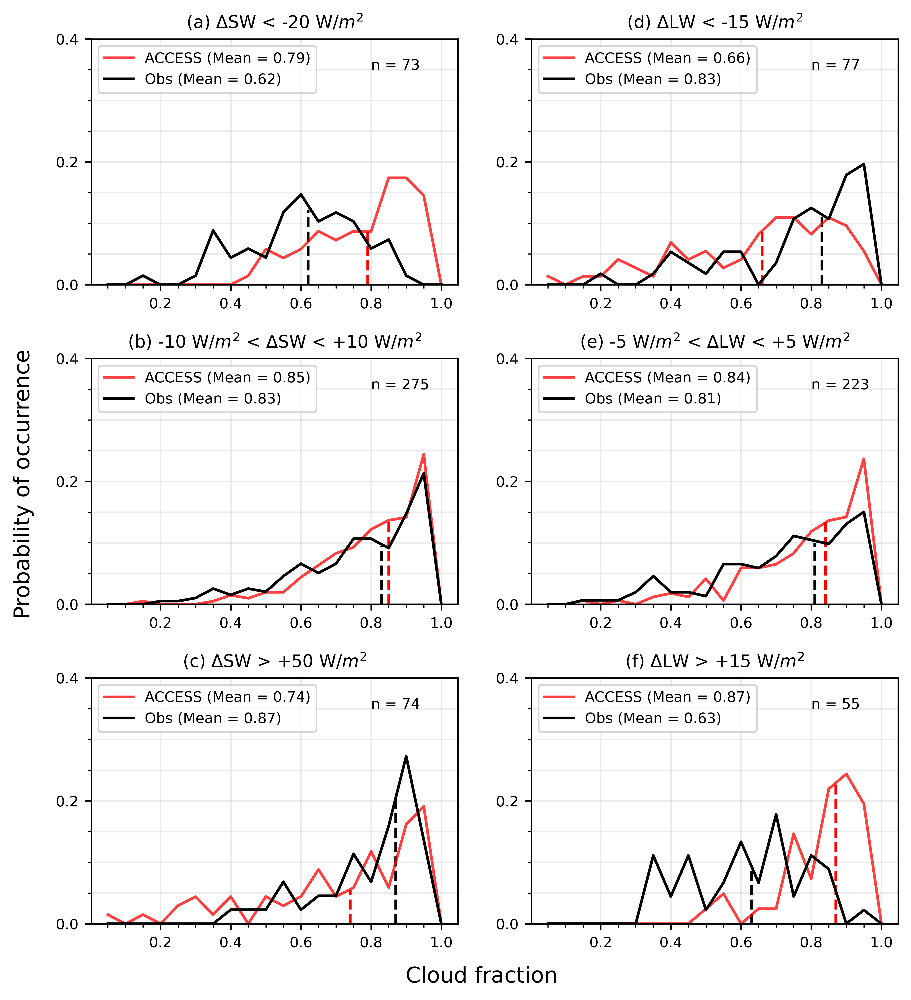

In [262]:
fig = plt.figure(figsize=(8,9),dpi=600)
plt.subplots_adjust(hspace=0.3)
plt.rcParams.update({'font.size': 8}) 
fig.text(0.5, 0.08, 'Cloud fraction', ha='center', va='center',fontsize=12)
fig.text(0.06, 0.5, 'Probability of occurrence', ha='center', va='center', rotation='vertical',fontsize=12)

ax1 = plt.subplot(321,)
plt.plot(edge, h11, label='ACCESS (Mean = 0.79)',color='red',alpha=0.75); #73
plt.plot(edge, h41, label='Obs (Mean = 0.62)',color='black');
plt.annotate('n = 73', (0.8,0.35))
ax1.vlines([0.79], 0, 0.09, linestyles='dashed', colors='red')
ax1.vlines([0.62], 0, 0.122, linestyles='dashed', colors='black')
plt.legend(loc='upper left');
plt.title('(a) $\Delta$SW < -20 W/$m^{2}$')
ax = plt.gca()
xmajorLocator = MultipleLocator(0.2)
xmajorFormatter = FormatStrFormatter('%1.1f')
xminorLocator = MultipleLocator(0.05) 
ymajorLocator = MultipleLocator(0.2)
ymajorFormatter = FormatStrFormatter('%1.1f')
yminorLocator = MultipleLocator(0.05) 
plt.ylim(0, 0.4, 0.1)
ax.xaxis.set_major_locator(xmajorLocator)
ax.xaxis.set_minor_locator(xminorLocator)
ax.yaxis.set_major_locator(ymajorLocator)
ax.yaxis.set_minor_locator(yminorLocator)
ax.xaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='minor', alpha=0.25)


ax2 = plt.subplot(323,)
plt.plot(edge, h21, label='ACCESS (Mean = 0.85)',color='red',alpha=0.75); # 275
plt.plot(edge, h51, label='Obs (Mean = 0.83)',color='black');
ax2.vlines([0.85], 0, 0.135, linestyles='dashed', colors='red')
ax2.vlines([0.83], 0, 0.095, linestyles='dashed', colors='black')
plt.annotate('n = 275', (0.8,0.35))
plt.legend(loc='upper left');
plt.title('(b) -10 W/$m^{2}$ < $\Delta$SW < +10 W/$m^{2}$')
ax = plt.gca()
xmajorLocator = MultipleLocator(0.2)
xmajorFormatter = FormatStrFormatter('%1.1f')
xminorLocator = MultipleLocator(0.05) 
ymajorLocator = MultipleLocator(0.2)
ymajorFormatter = FormatStrFormatter('%1.1f')
yminorLocator = MultipleLocator(0.05) 
plt.ylim(0, 0.4, 0.1)
ax.xaxis.set_major_locator(xmajorLocator)
ax.xaxis.set_minor_locator(xminorLocator)
ax.yaxis.set_major_locator(ymajorLocator)
ax.yaxis.set_minor_locator(yminorLocator)
ax.xaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='minor', alpha=0.25)


ax3 = plt.subplot(325,) 
plt.plot(edge, h31, label='ACCESS (Mean = 0.74)',color='red',alpha=0.75); # 74
plt.plot(edge, h61, label='Obs (Mean = 0.87)',color='black');
ax3.vlines([0.74], 0, 0.055, linestyles='dashed', colors='red')
ax3.vlines([0.87], 0, 0.21, linestyles='dashed', colors='black')
plt.annotate('n = 74', (0.8,0.35))
plt.legend(loc='upper left');
plt.title('(c) $\Delta$SW > +50 W/$m^{2}$')
ax = plt.gca()
xmajorLocator = MultipleLocator(0.2)
xmajorFormatter = FormatStrFormatter('%1.1f')
xminorLocator = MultipleLocator(0.05) 
ymajorLocator = MultipleLocator(0.2)
ymajorFormatter = FormatStrFormatter('%1.1f')
yminorLocator = MultipleLocator(0.05) 
plt.ylim(0, 0.4, 0.1)
ax.xaxis.set_major_locator(xmajorLocator)
ax.xaxis.set_minor_locator(xminorLocator)
ax.yaxis.set_major_locator(ymajorLocator)
ax.yaxis.set_minor_locator(yminorLocator)
ax.xaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='minor', alpha=0.25)

ax4 = plt.subplot(322,)
plt.plot(edge, h12, label='ACCESS (Mean = 0.66)',color='red',alpha=0.75); # 77
plt.plot(edge, h42, label='Obs (Mean = 0.83)',color='black');
ax4.vlines([0.66], 0, 0.09, linestyles='dashed', colors='red')
ax4.vlines([0.83], 0, 0.115, linestyles='dashed', colors='black')
plt.annotate('n = 77', (0.8,0.35),)
plt.legend(loc='upper left');
plt.title('(d) $\Delta$LW < -15 W/$m^{2}$')
ax = plt.gca()
xmajorLocator = MultipleLocator(0.2)
xmajorFormatter = FormatStrFormatter('%1.1f')
xminorLocator = MultipleLocator(0.05) 
ymajorLocator = MultipleLocator(0.2)
ymajorFormatter = FormatStrFormatter('%1.1f')
yminorLocator = MultipleLocator(0.05) 
plt.ylim(0, 0.4, 0.1)
ax.xaxis.set_major_locator(xmajorLocator)
ax.xaxis.set_minor_locator(xminorLocator)
ax.yaxis.set_major_locator(ymajorLocator)
ax.yaxis.set_minor_locator(yminorLocator)
ax.xaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='minor', alpha=0.25)

ax5 = plt.subplot(324,)
plt.plot(edge, h22, label='ACCESS (Mean = 0.84)',color='red',alpha=0.75); # 223
plt.plot(edge, h52, label='Obs (Mean = 0.81)',color='black');
ax5.vlines([0.84], 0, 0.135, linestyles='dashed', colors='red')
ax5.vlines([0.81], 0, 0.1, linestyles='dashed', colors='black')
plt.annotate('n = 223', (0.8,0.35))
plt.legend(loc='upper left');
plt.title('(e) -5 W/$m^{2}$ < $\Delta$LW < +5 W/$m^{2}$')

ax = plt.gca()
xmajorLocator = MultipleLocator(0.2)
xmajorFormatter = FormatStrFormatter('%1.1f')
xminorLocator = MultipleLocator(0.05) 
ymajorLocator = MultipleLocator(0.2)
ymajorFormatter = FormatStrFormatter('%1.1f')
yminorLocator = MultipleLocator(0.05) 

plt.ylim(0, 0.4, 0.1)
ax.xaxis.set_major_locator(xmajorLocator)
ax.xaxis.set_minor_locator(xminorLocator)
ax.yaxis.set_major_locator(ymajorLocator)
ax.yaxis.set_minor_locator(yminorLocator)

ax.xaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='minor', alpha=0.25)


ax6 = plt.subplot(326,)
plt.plot(edge, h32, label='ACCESS (Mean = 0.87)',color='red',alpha=0.75); # 55
plt.plot(edge, h62, label='Obs (Mean = 0.63)',color='black');
ax6.vlines([0.87], 0, 0.228, linestyles='dashed', colors='red')
ax6.vlines([0.63], 0, 0.09, linestyles='dashed', colors='black')
plt.annotate('n = 55', (0.8,0.35))
plt.legend(loc='upper left');
plt.title('(f) $\Delta$LW > +15 W/$m^{2}$')

ax = plt.gca()
xmajorLocator = MultipleLocator(0.2)
xmajorFormatter = FormatStrFormatter('%1.1f')
xminorLocator = MultipleLocator(0.05) 
ymajorLocator = MultipleLocator(0.2)
ymajorFormatter = FormatStrFormatter('%1.1f')
yminorLocator = MultipleLocator(0.05) 

plt.ylim(0, 0.4, 0.1)
ax.xaxis.set_major_locator(xmajorLocator)
ax.xaxis.set_minor_locator(xminorLocator)
ax.yaxis.set_major_locator(ymajorLocator)
ax.yaxis.set_minor_locator(yminorLocator)

ax.xaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='major', alpha=0.25)
ax.yaxis.grid(True, which='minor', alpha=0.25)

#plt.savefig('/Users/peizhangcheng/Desktop/CF_bias.jpg')

Text(0.5, 0, 'Cloud Fraction')

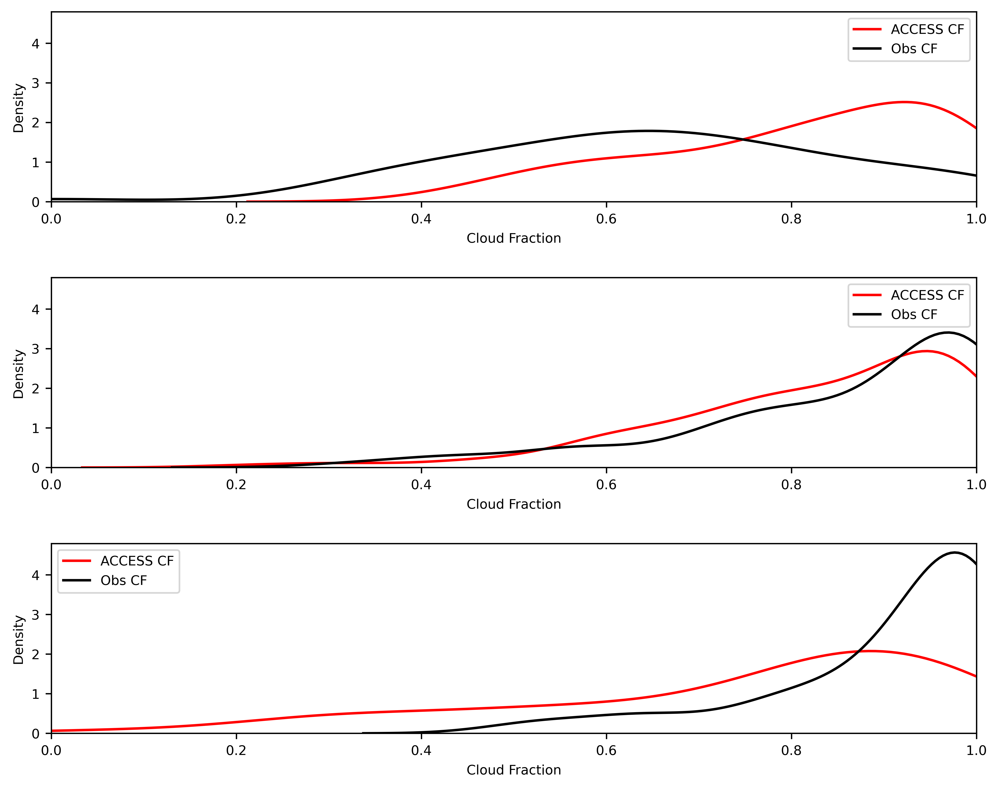

In [66]:
fig = plt.figure(figsize=(10,8),dpi=600)
plt.subplots_adjust(hspace=0.4)

ax1 = plt.subplot(311,)
sns.kdeplot(x=CF_ACCESS_negSW, label='ACCESS CF',color='red')
sns.kdeplot(x=CF_Obs_negSW, label='Obs CF',color='black')
plt.legend()
plt.xlim(0,1)
plt.xlabel('Cloud Fraction')

ax2 = plt.subplot(312,sharey=ax1)
sns.kdeplot(x=CF_ACCESS_midSW, label='ACCESS CF',color='red')
sns.kdeplot(x=CF_Obs_midSW, label='Obs CF',color='black')
plt.legend()
plt.xlim(0,1)
plt.xlabel('Cloud Fraction')

ax3 = plt.subplot(313,sharey=ax1)
sns.kdeplot(x=CF_ACCESS_posSW, label='ACCESS CF',color='red')
sns.kdeplot(x=CF_Obs_posSW, label='Obs CF',color='black')
plt.legend()
plt.xlim(0,1)
plt.xlabel('Cloud Fraction')

Text(0, 0.5, 'Density')

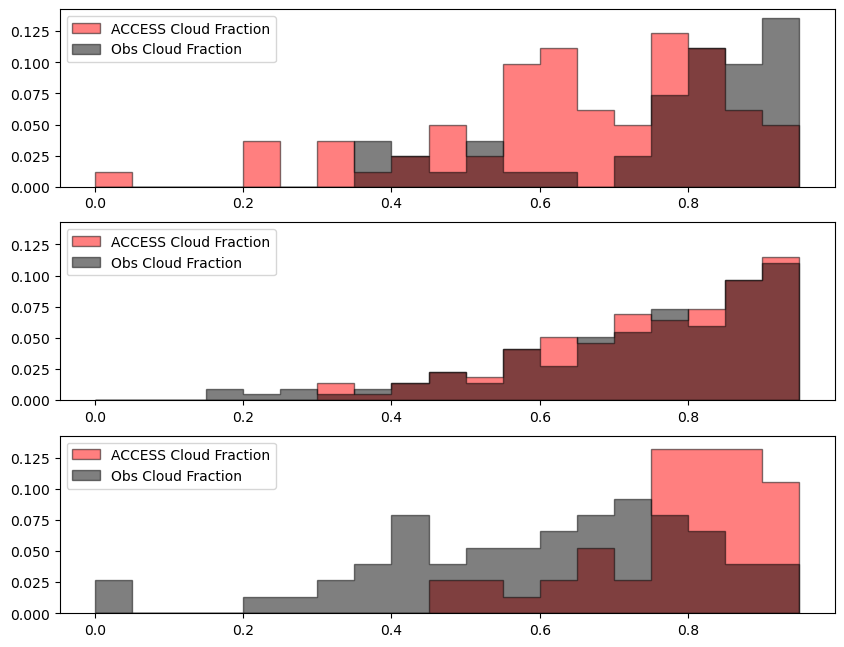

In [63]:
fig = plt.figure(figsize=(10,8),dpi=100)

weights1 = np.ones_like(CF_ACCESS_negLW) / len(CF_ACCESS_negLW)
weights2 = np.ones_like(CF_ACCESS_midLW) / len(CF_ACCESS_midLW)
weights3 = np.ones_like(CF_ACCESS_posLW) / len(CF_ACCESS_posLW)
weights4 = np.ones_like(CF_Obs_negLW) / len(CF_Obs_negLW)
weights5 = np.ones_like(CF_Obs_midLW) / len(CF_Obs_midLW)
weights6 = np.ones_like(CF_Obs_posLW) / len(CF_Obs_posLW)

ax1 = plt.subplot(311,)
plt.hist(CF_ACCESS_negLW, weights=weights1, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'red', edgecolor='black', label='ACCESS Cloud Fraction')
plt.hist(CF_Obs_negLW, weights=weights4, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'black', edgecolor='black', label='Obs Cloud Fraction')
plt.legend(loc='upper left')
ax.set_ylabel("Density", fontsize=14)

ax2 = plt.subplot(312,sharey=ax1)
plt.hist(CF_ACCESS_midLW, weights=weights2, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'red', edgecolor='black', label='ACCESS Cloud Fraction')
plt.hist(CF_Obs_midLW, weights=weights5, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'black', edgecolor='black', label='Obs Cloud Fraction')
plt.legend(loc='upper left')
ax.set_ylabel("Density", fontsize=14)

ax3 = plt.subplot(313,sharey=ax1)
plt.hist(CF_ACCESS_posLW, weights=weights3, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'red', edgecolor='black', label='ACCESS Cloud Fraction')
plt.hist(CF_Obs_posLW, weights=weights6, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'black', edgecolor='black', label='Obs Cloud Fraction')
plt.legend(loc='upper left')
ax.set_ylabel("Density", fontsize=14)

Text(0.5, 0, 'Cloud Fraction')

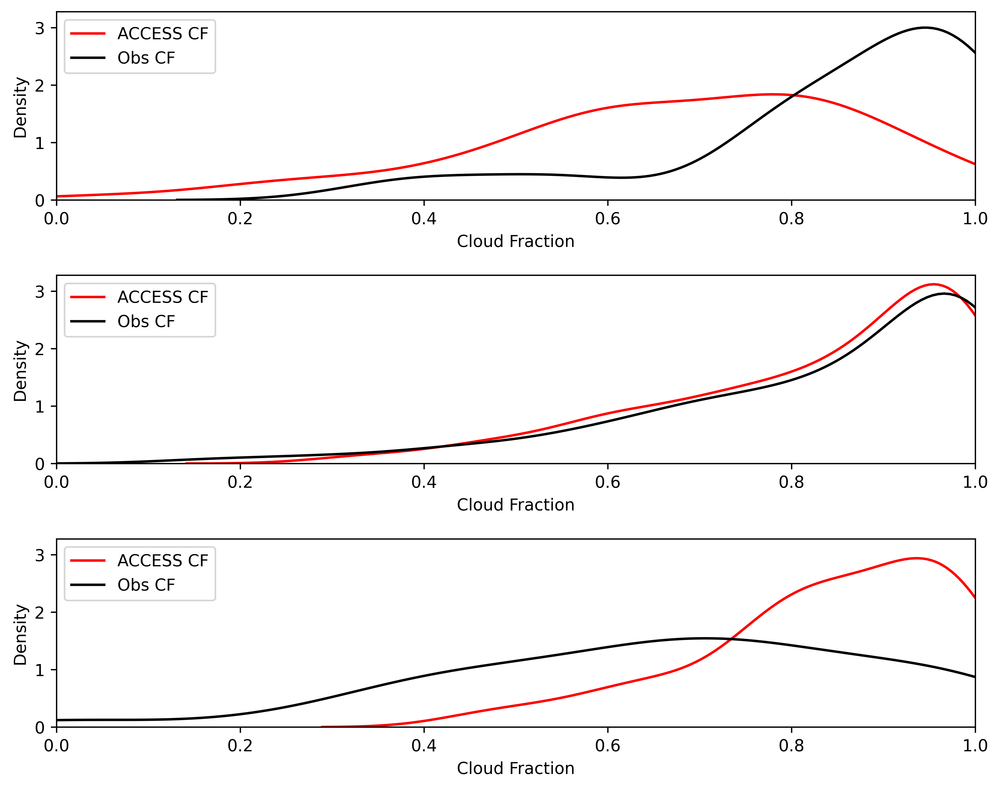

In [64]:
fig = plt.figure(figsize=(10,8),dpi=600)
plt.subplots_adjust(hspace=0.4)

ax1 = plt.subplot(311,)
sns.kdeplot(x=CF_ACCESS_negLW, label='ACCESS CF',color='red')
sns.kdeplot(x=CF_Obs_negLW, label='Obs CF',color='black')
plt.legend()
plt.xlim(0,1)
plt.xlabel('Cloud Fraction')

ax2 = plt.subplot(312,sharey=ax1)
sns.kdeplot(x=CF_ACCESS_midLW, label='ACCESS CF',color='red')
sns.kdeplot(x=CF_Obs_midLW, label='Obs CF',color='black')
plt.legend()
plt.xlim(0,1)
plt.xlabel('Cloud Fraction')

ax3 = plt.subplot(313,sharey=ax1)
sns.kdeplot(x=CF_ACCESS_posLW, label='ACCESS CF',color='red')
sns.kdeplot(x=CF_Obs_posLW, label='Obs CF',color='black')
plt.legend()
plt.xlim(0,1)
plt.xlabel('Cloud Fraction')

Text(0, 0.5, 'Density')

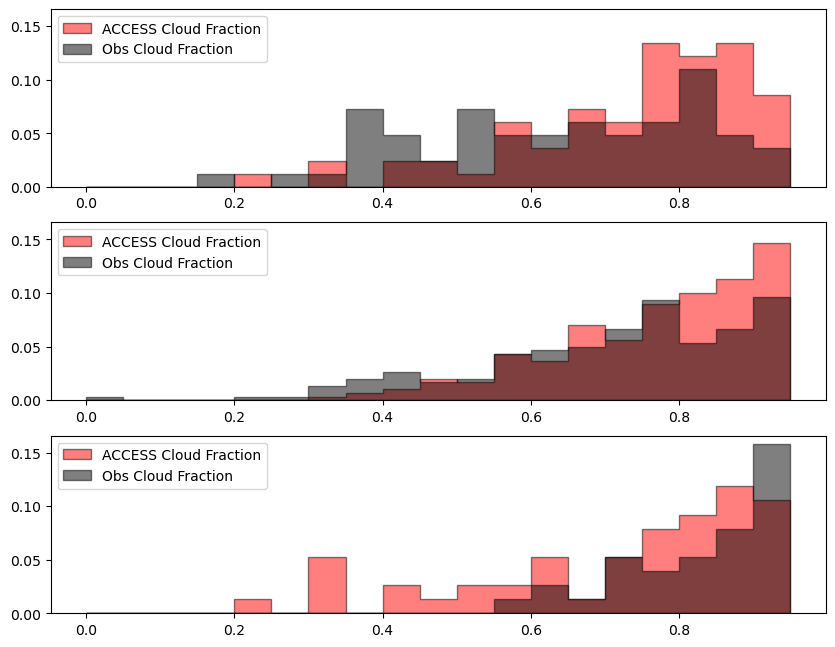

In [46]:
fig = plt.figure(figsize=(10,8),dpi=100)

weights1 = np.ones_like(CF_ACCESS_negCRE) / len(CF_ACCESS_negCRE)
weights2 = np.ones_like(CF_ACCESS_midCRE) / len(CF_ACCESS_midCRE)
weights3 = np.ones_like(CF_ACCESS_posCRE) / len(CF_ACCESS_posCRE)
weights4 = np.ones_like(CF_Obs_negCRE) / len(CF_Obs_negCRE)
weights5 = np.ones_like(CF_Obs_midCRE) / len(CF_Obs_midCRE)
weights6 = np.ones_like(CF_Obs_posCRE) / len(CF_Obs_posCRE)

ax1 = plt.subplot(311,)
plt.hist(CF_ACCESS_negCRE, weights=weights1, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'red', edgecolor='black', label='ACCESS Cloud Fraction')
plt.hist(CF_Obs_negCRE, weights=weights4, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'black', edgecolor='black', label='Obs Cloud Fraction')
plt.legend(loc='upper left')
ax.set_ylabel("Density", fontsize=14)

ax2 = plt.subplot(312,sharey=ax1)
plt.hist(CF_ACCESS_midCRE, weights=weights2, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'red', edgecolor='black', label='ACCESS Cloud Fraction')
plt.hist(CF_Obs_midCRE, weights=weights5, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'black', edgecolor='black', label='Obs Cloud Fraction')
plt.legend(loc='upper left')
ax.set_ylabel("Density", fontsize=14)

ax3 = plt.subplot(313,sharey=ax1)
plt.hist(CF_ACCESS_posCRE, weights=weights3, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'red', edgecolor='black', label='ACCESS Cloud Fraction')
plt.hist(CF_Obs_posCRE, weights=weights6, bins=np.arange(0,1,0.05), histtype="stepfilled", alpha=0.5, color = 'black', edgecolor='black', label='Obs Cloud Fraction')
plt.legend(loc='upper left')
ax.set_ylabel("Density", fontsize=14)

Text(0.5, 0, 'Cloud Fraction')

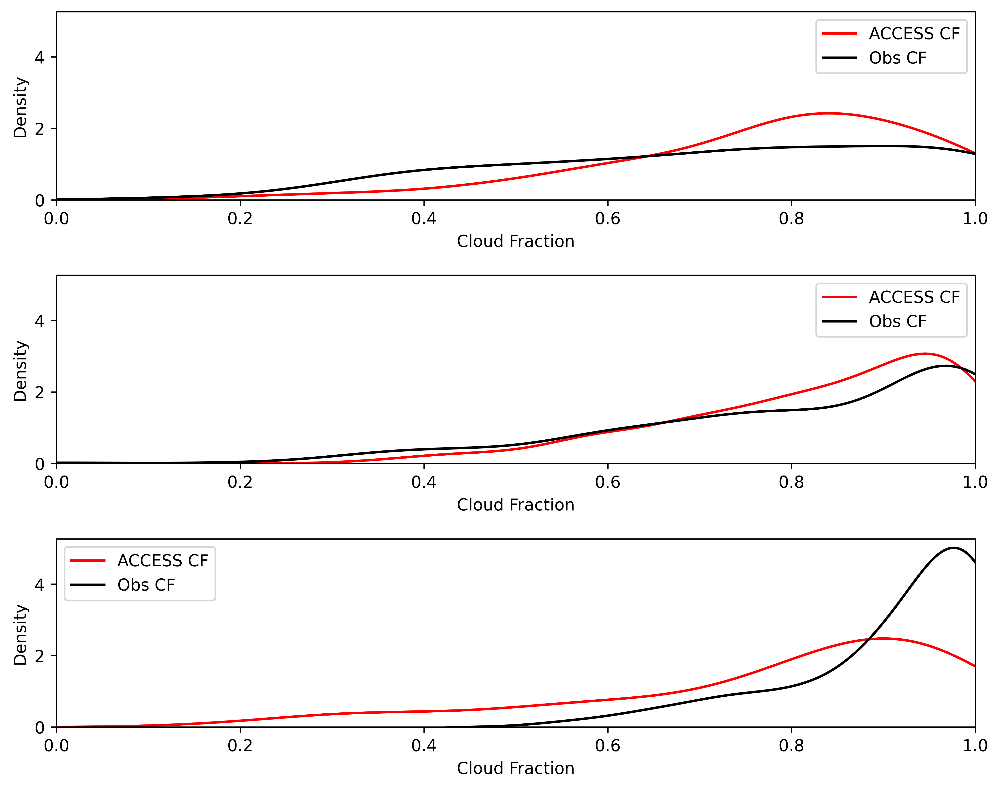

In [47]:
fig = plt.figure(figsize=(10,8),dpi=600)
plt.subplots_adjust(hspace=0.4)

ax1 = plt.subplot(311,)
sns.kdeplot(x=CF_ACCESS_negCRE, label='ACCESS CF',color='red')
sns.kdeplot(x=CF_Obs_negCRE, label='Obs CF',color='black')
plt.legend()
plt.xlim(0,1)
plt.xlabel('Cloud Fraction')

ax2 = plt.subplot(312,sharey=ax1)
sns.kdeplot(x=CF_ACCESS_midCRE, label='ACCESS CF',color='red')
sns.kdeplot(x=CF_Obs_midCRE, label='Obs CF',color='black')
plt.legend()
plt.xlim(0,1)
plt.xlabel('Cloud Fraction')

ax3 = plt.subplot(313,sharey=ax1)
sns.kdeplot(x=CF_ACCESS_posCRE, label='ACCESS CF',color='red')
sns.kdeplot(x=CF_Obs_posCRE, label='Obs CF',color='black')
plt.legend()
plt.xlim(0,1)
plt.xlabel('Cloud Fraction')